🚀 YOLOv11 OBB Model Test
🔍 CUDA Available: True
🎮 GPU: NVIDIA GeForce RTX 4070 Ti SUPER
💾 GPU Memory: 16.0GB

🔄 Loading YOLOv11 OBB model: /home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt
✅ Model loaded successfully
📝 Model name: /home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt
🎮 Device: cpu

🖼️ Loading image: /home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Xước mạ/2_0.jpg
📸 Image shape: (576, 768, 3)

🔄 Warming up model (3 runs)...
   Warmup run 1 completed
   Warmup run 2 completed
   Warmup run 3 completed

📊 Running benchmark (10 runs)...
   Run 1: 28.64ms
   Run 4: 11.13ms
   Run 7: 14.15ms
   Run 10: 11.44ms

⚡ Inference Statistics:
   Average: 14.89±5.28ms
   Min: 10.46ms
   Max: 26.16ms
   FPS: 67.2

🔍 Detection Analysis:
   Result type: <class 'ultralytics.engine.results.Results'>
   Detection type: OBB (Oriented Bounding Boxes)
   Number of detections: 1
   OBB data shape: torch.Size([1, 7])
   Confidence scores: [    0.77856]
   Class IDs: [          0]
   Detection 1: Class

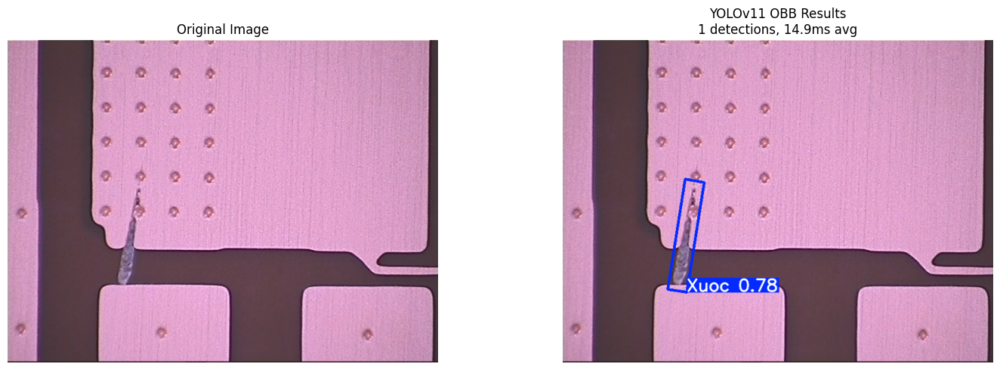


💾 Results saved to: /home/jkl0909/TestCycletimeMeiko/yolov11_results/yolov11_obb_result.jpg
📝 Detection details saved to: /home/jkl0909/TestCycletimeMeiko/yolov11_results/yolov11_obb_detections.txt

📊 Model Information:
   Model file: /home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt
   Task: OBB (Oriented Bounding Box)
   Input size: 640x640
   Device: cuda:0
   Model parameters: 2,653,918

🏆 Performance Summary:
   ⚡ Average inference: 14.89ms
   🎯 Detections found: 1
   📈 Throughput: 67.2 FPS

✅ Test completed successfully!
Final results: 14.89ms avg, 1 detections


In [19]:
import time
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import torch

def test_yolov11_obb():
    """Test YOLOv11 OBB model with .pt file"""
    
    # Paths
    model_path = "/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt"
    image_path = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Xước mạ/2_0.jpg"
    
    print("🚀 YOLOv11 OBB Model Test")
    print("=" * 50)
    
    # Check GPU availability
    print(f"🔍 CUDA Available: {torch.cuda.is_available()}")
    if torch.cuda.is_available():
        print(f"🎮 GPU: {torch.cuda.get_device_name(0)}")
        print(f"💾 GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f}GB")
    
    try:
        # Load YOLOv11 OBB model
        print(f"\n🔄 Loading YOLOv11 OBB model: {model_path}")
        model = YOLO(model_path, task='obb')
        
        print(f"✅ Model loaded successfully")
        print(f"📝 Model name: {model.model_name}")
        print(f"🎮 Device: {model.device}")
        
        # Load and display original image
        print(f"\n🖼️ Loading image: {image_path}")
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Cannot load image: {image_path}")
        
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        print(f"📸 Image shape: {image.shape}")
        
        # Display original image
        plt.figure(figsize=(15, 5))
        
        plt.subplot(1, 2, 1)
        plt.imshow(image_rgb)
        plt.title("Original Image")
        plt.axis('off')
        
        # Warmup runs
        print(f"\n🔄 Warming up model (3 runs)...")
        for i in range(3):
            _ = model(image, verbose=False)
            print(f"   Warmup run {i+1} completed")
        
        # Benchmark inference
        print(f"\n📊 Running benchmark (10 runs)...")
        times = []
        results = None
        
        for i in range(10):
            start_time = time.time()
            results = model(image, verbose=False, conf=0.25, device='cuda')
            end_time = time.time()
            
            inference_time = (end_time - start_time) * 1000
            times.append(inference_time)
            
            if i % 3 == 0:
                print(f"   Run {i+1}: {inference_time:.2f}ms")
        
        # Calculate statistics
        times = sorted(times)[1:-1]  # Remove fastest and slowest
        avg_time = np.mean(times)
        std_time = np.std(times)
        min_time = np.min(times)
        max_time = np.max(times)
        
        print(f"\n⚡ Inference Statistics:")
        print(f"   Average: {avg_time:.2f}±{std_time:.2f}ms")
        print(f"   Min: {min_time:.2f}ms")
        print(f"   Max: {max_time:.2f}ms")
        print(f"   FPS: {1000/avg_time:.1f}")
        
        # Process results
        result = results[0]
        
        # Check what type of detections we have
        print(f"\n🔍 Detection Analysis:")
        print(f"   Result type: {type(result)}")
        
        # For OBB (Oriented Bounding Box)
        if hasattr(result, 'obb') and result.obb is not None:
            detections = result.obb
            detection_type = "OBB (Oriented Bounding Boxes)"
            num_detections = len(detections)
            
            print(f"   Detection type: {detection_type}")
            print(f"   Number of detections: {num_detections}")
            
            if num_detections > 0:
                print(f"   OBB data shape: {detections.data.shape}")
                print(f"   Confidence scores: {detections.conf.cpu().numpy()}")
                print(f"   Class IDs: {detections.cls.cpu().numpy()}")
                
                # Print individual detections
                for i, (conf, cls) in enumerate(zip(detections.conf, detections.cls)):
                    print(f"   Detection {i+1}: Class={int(cls)}, Confidence={conf:.3f}")
        
        # For regular bounding boxes (fallback)
        elif hasattr(result, 'boxes') and result.boxes is not None:
            detections = result.boxes
            detection_type = "Regular Bounding Boxes"
            num_detections = len(detections)
            
            print(f"   Detection type: {detection_type}")
            print(f"   Number of detections: {num_detections}")
            
            if num_detections > 0:
                print(f"   Boxes data shape: {detections.data.shape}")
                print(f"   Confidence scores: {detections.conf.cpu().numpy()}")
                print(f"   Class IDs: {detections.cls.cpu().numpy()}")
        else:
            print("   No detections found")
            num_detections = 0
        
        # Visualize results
        if num_detections > 0:
            print(f"\n🎨 Visualizing {num_detections} detections...")
            
            # Get annotated image from YOLO
            annotated_image = result.plot(
                conf=True,          # Show confidence scores
                labels=True,        # Show labels
                boxes=True,         # Show bounding boxes
                line_width=3,       # Line thickness
                font_size=12        # Font size for labels
            )
            
            # Convert BGR to RGB for matplotlib
            annotated_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
            
            # Display result
            plt.subplot(1, 2, 2)
            plt.imshow(annotated_rgb)
            plt.title(f"YOLOv11 OBB Results\n{num_detections} detections, {avg_time:.1f}ms avg")
            plt.axis('off')
            
        else:
            plt.subplot(1, 2, 2)
            plt.imshow(image_rgb)
            plt.title("No Detections Found")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Save results
        output_dir = "/home/jkl0909/TestCycletimeMeiko/yolov11_results"
        import os
        os.makedirs(output_dir, exist_ok=True)
        
        if num_detections > 0:
            # Save annotated image
            output_path = f"{output_dir}/yolov11_obb_result.jpg"
            cv2.imwrite(output_path, annotated_image)
            print(f"\n💾 Results saved to: {output_path}")
            
            # Save detailed results
            results_txt_path = f"{output_dir}/yolov11_obb_detections.txt"
            with open(results_txt_path, 'w') as f:
                f.write(f"YOLOv11 OBB Detection Results\n")
                f.write(f"Model: {model_path}\n")
                f.write(f"Image: {image_path}\n")
                f.write(f"Average inference time: {avg_time:.2f}ms\n")
                f.write(f"Total detections: {num_detections}\n\n")
                
                if hasattr(result, 'obb') and result.obb is not None:
                    detections = result.obb
                    for i, (conf, cls) in enumerate(zip(detections.conf, detections.cls)):
                        f.write(f"Detection {i+1}: Class={int(cls)}, Confidence={conf:.3f}\n")
                elif hasattr(result, 'boxes') and result.boxes is not None:
                    detections = result.boxes
                    for i, (conf, cls) in enumerate(zip(detections.conf, detections.cls)):
                        f.write(f"Detection {i+1}: Class={int(cls)}, Confidence={conf:.3f}\n")
            
            print(f"📝 Detection details saved to: {results_txt_path}")
        
        # Model information
        print(f"\n📊 Model Information:")
        print(f"   Model file: {model_path}")
        print(f"   Task: OBB (Oriented Bounding Box)")
        print(f"   Input size: 640x640")
        print(f"   Device: {model.device}")
        print(f"   Model parameters: {sum(p.numel() for p in model.model.parameters()):,}")
        
        # Performance summary
        print(f"\n🏆 Performance Summary:")
        print(f"   ⚡ Average inference: {avg_time:.2f}ms")
        print(f"   🎯 Detections found: {num_detections}")
        print(f"   📈 Throughput: {1000/avg_time:.1f} FPS")
        
        return {
            'avg_time': avg_time,
            'std_time': std_time,
            'num_detections': num_detections,
            'results': results
        }
        
    except Exception as e:
        print(f"❌ Error: {str(e)}")
        import traceback
        traceback.print_exc()
        return None

# Run the test
if __name__ == "__main__":
    test_results = test_yolov11_obb()
    
    if test_results:
        print(f"\n✅ Test completed successfully!")
        print(f"Final results: {test_results['avg_time']:.2f}ms avg, {test_results['num_detections']} detections")
    else:
        print(f"\n❌ Test failed!")

In [3]:
from ultralytics import YOLO

# Load a model
model = YOLO("/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt")  # load an official model

# Export the model
model.export(format="onnx")

Ultralytics 8.3.155 🚀 Python-3.10.18 torch-2.7.1+cu128 CPU (Intel Core(TM) i7-14700K)
YOLO11n-obb summary (fused): 109 layers, 2,653,918 parameters, 0 gradients, 6.6 GFLOPs

PyTorch: starting from '/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.4 MB)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.57...
ONNX: export success ✅ 0.9s, saved as '/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx' (10.3 MB)

Export complete (1.2s)
Results saved to /home/jkl0909/TestCycletimeMeiko/xuoc
Predict:         yolo predict task=obb model=/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx imgsz=640  
Validate:        yolo val task=obb model=/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx imgsz=640 data=D:\aoi_inspection\data\Datasets_OBB\AutoVRS_Xuoc.v1i.yolov8-obb\data.yaml  
Visualize:       https://netron.app


'/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx'

🚀 YOLOv11 OBB ONNX GPU Test
🔍 PyTorch CUDA Available: True
🎮 GPU: NVIDIA GeForce RTX 4070 Ti SUPER
💾 GPU Memory: 16.0GB
🔧 Available ONNX providers: ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']
✅ Using CUDAExecutionProvider

🔄 Loading ONNX model: /home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx
✅ ONNX model loaded successfully
🔧 Active provider: CUDAExecutionProvider
📐 Input: images - [1, 3, 640, 640] - tensor(float)
📐 Output: output0 - [1, 6, 8400] - tensor(float)

🖼️ Loading and preprocessing image: /home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Xước mạ/2_0.jpg
📸 Original image shape: (576, 768, 3)
✅ Preprocessed shape: (1, 3, 640, 640)
📏 Scale: 0.833, Padding: (0, 80)

🔄 Warming up ONNX model (5 runs)...
   Warmup run 1: 194.22ms
   Warmup run 2: 49.56ms
   Warmup run 3: 37.28ms
   Warmup run 4: 25.77ms
   Warmup run 5: 25.95ms

📊 Running benchmark (15 runs)...
   Run 1: 18.94ms
   Run 6: 23.45ms
   Run 11: 7.18ms

⚡ ONNX GPU Inference Statisti

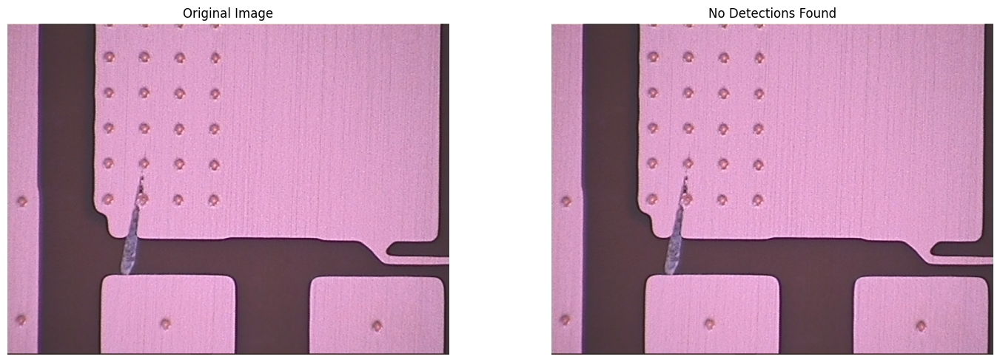


🏆 ONNX GPU Performance Summary:
   🔧 Provider: CUDAExecutionProvider
   ⚡ Average inference: 16.46ms
   🎯 Detections found: 0
   📈 Throughput: 60.8 FPS

✅ ONNX GPU test completed successfully!
Final results: 16.46ms avg, 0 detections, Provider: CUDAExecutionProvider


In [4]:
import time
import cv2
import numpy as np
import matplotlib.pyplot as plt
import onnxruntime as ort
import torch

def test_yolov11_onnx_gpu():
    """Test YOLOv11 OBB ONNX model with GPU"""
    
    # Paths
    onnx_path = "/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx"
    image_path = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Xước mạ/2_0.jpg"
    
    print("🚀 YOLOv11 OBB ONNX GPU Test")
    print("=" * 50)
    
    # Check CUDA availability
    print(f"🔍 PyTorch CUDA Available: {torch.cuda.is_available()}")
    if torch.cuda.is_available():
        print(f"🎮 GPU: {torch.cuda.get_device_name(0)}")
        print(f"💾 GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f}GB")
    
    # Check ONNX Runtime providers
    available_providers = ort.get_available_providers()
    print(f"🔧 Available ONNX providers: {available_providers}")
    
    # Set up providers with GPU preference
    providers = []
    if 'CUDAExecutionProvider' in available_providers:
        providers.append(('CUDAExecutionProvider', {
            'device_id': 0,
            'arena_extend_strategy': 'kNextPowerOfTwo',
            'gpu_mem_limit': 4 * 1024 * 1024 * 1024,  # 4GB limit
            'cudnn_conv_algo_search': 'EXHAUSTIVE',
            'do_copy_in_default_stream': True,
        }))
        print("✅ Using CUDAExecutionProvider")
    else:
        print("⚠️ CUDAExecutionProvider not available")
    
    providers.append('CPUExecutionProvider')
    
    try:
        # Load ONNX model
        print(f"\n🔄 Loading ONNX model: {onnx_path}")
        session = ort.InferenceSession(onnx_path, providers=providers)
        
        # Print model info
        print(f"✅ ONNX model loaded successfully")
        print(f"🔧 Active provider: {session.get_providers()[0]}")
        
        # Get model input/output info
        input_info = session.get_inputs()[0]
        output_info = session.get_outputs()[0]
        
        print(f"📐 Input: {input_info.name} - {input_info.shape} - {input_info.type}")
        print(f"📐 Output: {output_info.name} - {output_info.shape} - {output_info.type}")
        
        # Load and preprocess image
        print(f"\n🖼️ Loading and preprocessing image: {image_path}")
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Cannot load image: {image_path}")
        
        original_shape = image.shape
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        print(f"📸 Original image shape: {original_shape}")
        
        # Preprocess image for YOLO
        def preprocess_image(img, target_size=640):
            # Resize while maintaining aspect ratio
            h, w = img.shape[:2]
            scale = min(target_size / h, target_size / w)
            new_h, new_w = int(h * scale), int(w * scale)
            
            # Resize image
            resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
            
            # Create padded image
            padded = np.full((target_size, target_size, 3), 114, dtype=np.uint8)
            
            # Calculate padding offsets
            pad_h = (target_size - new_h) // 2
            pad_w = (target_size - new_w) // 2
            
            # Place resized image in center
            padded[pad_h:pad_h + new_h, pad_w:pad_w + new_w] = resized
            
            # Normalize to [0, 1] and convert to CHW format
            normalized = padded.astype(np.float32) / 255.0
            chw = np.transpose(normalized, (2, 0, 1))  # HWC to CHW
            batch = np.expand_dims(chw, axis=0)  # Add batch dimension
            
            return np.ascontiguousarray(batch), scale, pad_h, pad_w
        
        input_tensor, scale, pad_h, pad_w = preprocess_image(image_rgb)
        print(f"✅ Preprocessed shape: {input_tensor.shape}")
        print(f"📏 Scale: {scale:.3f}, Padding: ({pad_w}, {pad_h})")
        
        # Display original image
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(image_rgb)
        plt.title("Original Image")
        plt.axis('off')
        
        # Warmup runs
        print(f"\n🔄 Warming up ONNX model (5 runs)...")
        input_name = input_info.name
        
        for i in range(5):
            start_time = time.time()
            _ = session.run(None, {input_name: input_tensor})
            warmup_time = (time.time() - start_time) * 1000
            print(f"   Warmup run {i+1}: {warmup_time:.2f}ms")
        
        # Benchmark inference
        print(f"\n📊 Running benchmark (15 runs)...")
        times = []
        outputs = None
        
        for i in range(15):
            start_time = time.time()
            outputs = session.run(None, {input_name: input_tensor})
            end_time = time.time()
            
            inference_time = (end_time - start_time) * 1000
            times.append(inference_time)
            
            if i % 5 == 0:
                print(f"   Run {i+1}: {inference_time:.2f}ms")
        
        # Calculate statistics (remove outliers)
        times = sorted(times)[2:-2]  # Remove 2 fastest and 2 slowest
        avg_time = np.mean(times)
        std_time = np.std(times)
        min_time = np.min(times)
        max_time = np.max(times)
        
        print(f"\n⚡ ONNX GPU Inference Statistics:")
        print(f"   Average: {avg_time:.2f}±{std_time:.2f}ms")
        print(f"   Min: {min_time:.2f}ms")
        print(f"   Max: {max_time:.2f}ms")
        print(f"   FPS: {1000/avg_time:.1f}")
        
        # Post-process results
        def postprocess_onnx_output(output, scale, pad_h, pad_w, original_shape, conf_threshold=0.25):
            """Post-process ONNX output"""
            print("🔄 Post-processing ONNX output...")
            
            # ONNX output format: typically [1, num_classes+5, num_anchors] or [1, num_anchors, num_classes+5]
            predictions = output[0]  # Get first (and usually only) output
            print(f"📊 Raw output shape: {predictions.shape}")
            
            # Handle different output formats
            if len(predictions.shape) == 3:
                predictions = predictions[0]  # Remove batch dimension
            
            print(f"📊 Predictions shape after batch removal: {predictions.shape}")
            
            # Transpose if needed (make sure we have [num_detections, num_features])
            if predictions.shape[0] < predictions.shape[1]:
                predictions = predictions.T
                print(f"📊 Transposed predictions shape: {predictions.shape}")
            
            # Extract components - assuming format: [x, y, w, h, confidence, class_scores...]
            if predictions.shape[1] >= 6:  # At least x, y, w, h, conf, class
                boxes = predictions[:, :4]  # x, y, w, h
                confidences = predictions[:, 4]  # confidence
                class_scores = predictions[:, 5:]  # class probabilities
                
                # Get class with highest score
                class_ids = np.argmax(class_scores, axis=1)
                max_class_scores = np.max(class_scores, axis=1)
                
                # Final confidence = objectness * class_confidence
                final_confidences = confidences * max_class_scores
                
            elif predictions.shape[1] >= 5:  # x, y, w, h, conf (single class)
                boxes = predictions[:, :4]
                final_confidences = predictions[:, 4]
                class_ids = np.zeros(len(predictions), dtype=int)  # Single class
            else:
                print(f"⚠️ Unexpected output format: {predictions.shape}")
                return [], [], []
            
            print(f"📊 Total predictions: {len(predictions)}")
            print(f"📊 Max confidence: {np.max(final_confidences):.3f}")
            
            # Filter by confidence
            valid_mask = final_confidences > conf_threshold
            
            if np.any(valid_mask):
                valid_boxes = boxes[valid_mask]
                valid_confidences = final_confidences[valid_mask]
                valid_class_ids = class_ids[valid_mask]
                
                print(f"🎯 Found {len(valid_boxes)} detections above threshold {conf_threshold}")
                
                # Convert coordinates back to original image space
                processed_boxes = []
                for box in valid_boxes:
                    x_center, y_center, w, h = box
                    
                    # Scale back to original coordinates
                    x_center = (x_center - pad_w) / scale
                    y_center = (y_center - pad_h) / scale
                    w = w / scale
                    h = h / scale
                    
                    # Clamp to image boundaries
                    x_center = max(w/2, min(x_center, original_shape[1] - w/2))
                    y_center = max(h/2, min(y_center, original_shape[0] - h/2))
                    
                    processed_boxes.append([x_center, y_center, w, h])
                
                return processed_boxes, valid_confidences, valid_class_ids
            else:
                print("❌ No detections found")
                return [], [], []
        
        # Process the output
        boxes, confidences, class_ids = postprocess_onnx_output(
            outputs, scale, pad_h, pad_w, original_shape, conf_threshold=0.25
        )
        
        num_detections = len(boxes)
        
        # Visualize results
        if num_detections > 0:
            print(f"\n🎨 Visualizing {num_detections} detections...")
            
            # Draw detections
            result_image = image_rgb.copy()
            
            # Class names
            class_names = ['xuoc']  # Adjust based on your model
            colors = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0)]
            
            for i, (box, conf, cls_id) in enumerate(zip(boxes, confidences, class_ids)):
                x_center, y_center, w, h = box
                x1, y1 = int(x_center - w/2), int(y_center - h/2)
                x2, y2 = int(x_center + w/2), int(y_center + h/2)
                
                # Ensure coordinates are within bounds
                x1 = max(0, min(x1, result_image.shape[1]))
                y1 = max(0, min(y1, result_image.shape[0]))
                x2 = max(0, min(x2, result_image.shape[1]))
                y2 = max(0, min(y2, result_image.shape[0]))
                
                # Get color and class name
                color = colors[int(cls_id) % len(colors)]
                class_name = class_names[int(cls_id)] if int(cls_id) < len(class_names) else f"Class_{int(cls_id)}"
                
                # Draw bounding box
                cv2.rectangle(result_image, (x1, y1), (x2, y2), color, 3)
                
                # Draw label with background
                label = f"{class_name}: {conf:.2f}"
                (label_w, label_h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
                cv2.rectangle(result_image, (x1, y1-label_h-10), (x1+label_w, y1), color, -1)
                cv2.putText(result_image, label, (x1, y1-5), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
            
            # Display result
            plt.subplot(1, 2, 2)
            plt.imshow(result_image)
            plt.title(f"ONNX GPU Results\n{num_detections} detections, {avg_time:.1f}ms avg")
            plt.axis('off')
            
            # Print detection details
            print(f"\n🎯 Detection Details:")
            for i, (box, conf, cls_id) in enumerate(zip(boxes, confidences, class_ids)):
                x, y, w, h = box
                print(f"   Detection {i+1}: Class={int(cls_id)}, Confidence={conf:.3f}, "
                      f"Box=({x:.1f}, {y:.1f}, {w:.1f}, {h:.1f})")
        else:
            plt.subplot(1, 2, 2)
            plt.imshow(image_rgb)
            plt.title("No Detections Found")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Save results
        output_dir = "/home/jkl0909/TestCycletimeMeiko/onnx_gpu_results"
        import os
        os.makedirs(output_dir, exist_ok=True)
        
        if num_detections > 0:
            # Save result image
            result_bgr = cv2.cvtColor(result_image, cv2.COLOR_RGB2BGR)
            output_path = f"{output_dir}/onnx_gpu_result.jpg"
            cv2.imwrite(output_path, result_bgr)
            print(f"\n💾 Results saved to: {output_path}")
        
        # Performance summary
        print(f"\n🏆 ONNX GPU Performance Summary:")
        print(f"   🔧 Provider: {session.get_providers()[0]}")
        print(f"   ⚡ Average inference: {avg_time:.2f}ms")
        print(f"   🎯 Detections found: {num_detections}")
        print(f"   📈 Throughput: {1000/avg_time:.1f} FPS")
        
        return {
            'avg_time': avg_time,
            'std_time': std_time,
            'num_detections': num_detections,
            'provider': session.get_providers()[0]
        }
        
    except Exception as e:
        print(f"❌ Error: {str(e)}")
        import traceback
        traceback.print_exc()
        return None

# Run the test
if __name__ == "__main__":
    onnx_results = test_yolov11_onnx_gpu()
    
    if onnx_results:
        print(f"\n✅ ONNX GPU test completed successfully!")
        print(f"Final results: {onnx_results['avg_time']:.2f}ms avg, "
              f"{onnx_results['num_detections']} detections, "
              f"Provider: {onnx_results['provider']}")
    else:
        print(f"\n❌ ONNX GPU test failed!")

In [5]:
from ultralytics import YOLO

# Load model
model = YOLO('/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt')

# Export với settings đúng cho OBB
model.export(
    format='onnx',
    imgsz=640,
    dynamic=False,      # Quan trọng: Fixed input size
    simplify=True,      # Simplify ONNX graph
    opset=11,          # ONNX opset version
    half=False,        # Không dùng FP16 khi debug
    device='cpu'       # Export trên CPU để tránh lỗi
)

Ultralytics 8.3.155 🚀 Python-3.10.18 torch-2.7.1+cu128 CPU (Intel Core(TM) i7-14700K)
YOLO11n-obb summary (fused): 109 layers, 2,653,918 parameters, 0 gradients, 6.6 GFLOPs

PyTorch: starting from '/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.4 MB)

ONNX: starting export with onnx 1.17.0 opset 11...
ONNX: slimming with onnxslim 0.1.57...
ONNX: export success ✅ 0.8s, saved as '/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx' (10.3 MB)

Export complete (1.0s)
Results saved to /home/jkl0909/TestCycletimeMeiko/xuoc
Predict:         yolo predict task=obb model=/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx imgsz=640  
Validate:        yolo val task=obb model=/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx imgsz=640 data=D:\aoi_inspection\data\Datasets_OBB\AutoVRS_Xuoc.v1i.yolov8-obb\data.yaml  
Visualize:       https://netron.app


'/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx'

In [7]:
import onnx

def analyze_onnx_model():
    onnx_path = "/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx"
    
    # Load ONNX model
    model = onnx.load(onnx_path)
    
    # Print input/output info
    print("📐 ONNX Model Info:")
    print(f"Inputs: {len(model.graph.input)}")
    for inp in model.graph.input:
        print(f"  - {inp.name}: {[d.dim_value for d in inp.type.tensor_type.shape.dim]}")
    
    print(f"Outputs: {len(model.graph.output)}")
    for out in model.graph.output:
        print(f"  - {out.name}: {[d.dim_value for d in out.type.tensor_type.shape.dim]}")
    
    # Check if model is valid
    try:
        onnx.checker.check_model(model)
        print("✅ ONNX model is valid")
    except Exception as e:
        print(f"❌ ONNX model invalid: {e}")

analyze_onnx_model()

📐 ONNX Model Info:
Inputs: 1
  - images: [1, 3, 640, 640]
Outputs: 1
  - output0: [1, 6, 8400]
✅ ONNX model is valid


In [8]:
def postprocess_onnx_obb(output, scale, pad_h, pad_w, original_shape, conf_threshold=0.25):
    """Correct post-processing for ONNX OBB output"""
    print("🔄 Post-processing ONNX OBB output...")
    
    predictions = output[0]  # Remove batch dimension
    print(f"📊 Raw predictions shape: {predictions.shape}")
    
    # YOLO OBB output format: [1, 6, 8400] hoặc [1, 8400, 6]
    # 6 = [x, y, w, h, confidence, class_id]
    
    if predictions.shape[0] == 6:  # [6, 8400] format
        predictions = predictions.T  # -> [8400, 6]
    
    print(f"📊 Processed predictions shape: {predictions.shape}")
    
    # Extract components
    if predictions.shape[1] >= 6:
        boxes = predictions[:, :4]      # x, y, w, h (center format)
        confidences = predictions[:, 4]  # objectness confidence
        class_probs = predictions[:, 5]  # class probabilities (single class)
        
        # For single class, class_probs might be class_id instead of probability
        if np.all(class_probs == 0):  # All zeros = single class
            final_confidences = confidences
            class_ids = np.zeros(len(predictions), dtype=int)
        else:
            final_confidences = confidences * class_probs
            class_ids = np.zeros(len(predictions), dtype=int)
            
    elif predictions.shape[1] == 5:  # [x, y, w, h, conf] format
        boxes = predictions[:, :4]
        final_confidences = predictions[:, 4]
        class_ids = np.zeros(len(predictions), dtype=int)
    else:
        print(f"⚠️ Unexpected format: {predictions.shape}")
        return [], [], []
    
    print(f"📊 Confidence range: {np.min(final_confidences):.3f} - {np.max(final_confidences):.3f}")
    
    # Filter by confidence
    valid_mask = final_confidences > conf_threshold
    
    if np.any(valid_mask):
        valid_boxes = boxes[valid_mask]
        valid_confidences = final_confidences[valid_mask]
        valid_class_ids = class_ids[valid_mask]
        
        print(f"🎯 Found {len(valid_boxes)} detections above threshold {conf_threshold}")
        
        # Convert coordinates (IMPORTANT: Check if coordinates are normalized)
        processed_boxes = []
        for i, box in enumerate(valid_boxes):
            x_center, y_center, w, h = box
            
            # If coordinates are normalized [0-1], scale to input size first
            if np.max(box) <= 1.0:
                x_center *= 640
                y_center *= 640
                w *= 640
                h *= 640
            
            # Scale back to original image
            x_center = (x_center - pad_w) / scale
            y_center = (y_center - pad_h) / scale
            w = w / scale
            h = h / scale
            
            # Ensure positive dimensions
            w = max(1, w)
            h = max(1, h)
            
            # Clamp to image boundaries
            x_center = max(w/2, min(x_center, original_shape[1] - w/2))
            y_center = max(h/2, min(y_center, original_shape[0] - h/2))
            
            processed_boxes.append([x_center, y_center, w, h])
            
            # Debug first few detections
            if i < 3:
                print(f"   Detection {i+1}: raw=({box[0]:.3f}, {box[1]:.3f}, {box[2]:.3f}, {box[3]:.3f}) "
                      f"-> processed=({x_center:.1f}, {y_center:.1f}, {w:.1f}, {h:.1f})")
        
        return processed_boxes, valid_confidences, valid_class_ids
    else:
        print("❌ No detections found")
        return [], [], []

In [9]:
def re_export_onnx_optimized():
    """Re-export ONNX with optimized settings"""
    from ultralytics import YOLO
    import torch
    
    # Load PT model
    model = YOLO('/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt', task='obb')
    
    # Test PT model first
    print("🔍 Testing PT model...")
    test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Xước mạ/2_0.jpg"
    pt_results = model(test_image, conf=0.1, verbose=False)  # Lower confidence
    
    if pt_results[0].obb is not None:
        print(f"✅ PT model detects {len(pt_results[0].obb)} objects")
    else:
        print("❌ PT model doesn't detect anything!")
        return
    
    # Export with conservative settings
    print("🔄 Re-exporting ONNX...")
    export_path = model.export(
        format='onnx',
        imgsz=640,
        dynamic=False,
        simplify=False,  # Don't simplify to preserve accuracy
        opset=11,
        half=False,
        device='cpu',
        workspace=4,
        verbose=True
    )
    
    print(f"✅ ONNX exported to: {export_path}")
    
    # Test ONNX model
    print("🔍 Testing ONNX model...")
    onnx_model = YOLO(export_path, task='obb')
    onnx_results = onnx_model(test_image, conf=0.1, verbose=False)
    
    if onnx_results[0].obb is not None:
        print(f"✅ ONNX model detects {len(onnx_results[0].obb)} objects")
    else:
        print("❌ ONNX model still doesn't detect anything!")

# Run re-export
re_export_onnx_optimized()

🔍 Testing PT model...
✅ PT model detects 1 objects
🔄 Re-exporting ONNX...
Ultralytics 8.3.155 🚀 Python-3.10.18 torch-2.7.1+cu128 CPU (Intel Core(TM) i7-14700K)

PyTorch: starting from '/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.4 MB)

ONNX: starting export with onnx 1.17.0 opset 11...
ONNX: export success ✅ 0.4s, saved as '/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx' (10.3 MB)

Export complete (0.6s)
Results saved to /home/jkl0909/TestCycletimeMeiko/xuoc
Predict:         yolo predict task=obb model=/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx imgsz=640  
Validate:        yolo val task=obb model=/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx imgsz=640 data=D:\aoi_inspection\data\Datasets_OBB\AutoVRS_Xuoc.v1i.yolov8-obb\data.yaml  
Visualize:       https://netron.app
✅ ONNX exported to: /home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx
🔍 Testing ONNX model...
Loading /home/jkl0909/TestCycletimeMeiko/xuoc

In [1]:
import os
import time
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO
import torch
import onnxruntime as ort

def process_all_models_in_folder():
    """Process all models in Modelx folder"""
    
    # Paths
    models_folder = "/home/jkl0909/TestCycletimeMeiko/Modelx"
    test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Xước mạ/2_0.jpg"
    output_base = "/home/jkl0909/TestCycletimeMeiko/batch_results"
    
    print("🚀 Batch Processing All Models in Modelx")
    print("=" * 60)
    
    # Create output directory
    os.makedirs(output_base, exist_ok=True)
    
    # Check test image exists
    if not os.path.exists(test_image):
        print(f"❌ Test image not found: {test_image}")
        return
    
    # Scan for all model files
    model_files = []
    extensions = ['.pt', '.onnx', '.engine']
    
    print(f"🔍 Scanning folder: {models_folder}")
    
    if os.path.exists(models_folder):
        for root, dirs, files in os.walk(models_folder):
            for file in files:
                if any(file.endswith(ext) for ext in extensions):
                    full_path = os.path.join(root, file)
                    model_files.append(full_path)
    
    if not model_files:
        print(f"❌ No model files found in {models_folder}")
        return
    
    print(f"📁 Found {len(model_files)} model files:")
    for i, model_file in enumerate(model_files, 1):
        rel_path = os.path.relpath(model_file, models_folder)
        print(f"   {i}. {rel_path}")
    
    print("=" * 60)
    
    # Process each model
    results_summary = []
    
    for i, model_path in enumerate(model_files, 1):
        model_name = os.path.basename(model_path)
        model_type = os.path.splitext(model_path)[1]
        
        print(f"\n🔄 Processing Model {i}/{len(model_files)}: {model_name}")
        print("-" * 50)
        
        try:
            if model_type == '.pt':
                result = process_pytorch_model(model_path, test_image, output_base)
            elif model_type == '.onnx':
                result = process_onnx_model(model_path, test_image, output_base)
            elif model_type == '.engine':
                result = process_tensorrt_model(model_path, test_image, output_base)
            else:
                print(f"⚠️ Unsupported model type: {model_type}")
                continue
            
            if result:
                result['model_name'] = model_name
                result['model_type'] = model_type
                result['model_path'] = model_path
                results_summary.append(result)
                
        except Exception as e:
            print(f"❌ Error processing {model_name}: {str(e)}")
            results_summary.append({
                'model_name': model_name,
                'model_type': model_type,
                'model_path': model_path,
                'status': 'failed',
                'error': str(e)
            })
    
    # Generate summary report
    generate_summary_report(results_summary, output_base)
    
    return results_summary

def process_pytorch_model(model_path, test_image, output_base):
    """Process PyTorch .pt model"""
    model_name = os.path.splitext(os.path.basename(model_path))[0]
    
    try:
        # Load model
        model = YOLO(model_path, task='obb')
        print(f"✅ Loaded PT model: {model.model_name}")
        
        # Export to ONNX if not exists
        onnx_path = os.path.join(os.path.dirname(model_path), f"{model_name}.onnx")
        if not os.path.exists(onnx_path):
            print("🔄 Exporting to ONNX...")
            try:
                model.export(
                    format='onnx',
                    imgsz=640,
                    dynamic=False,
                    simplify=False,
                    opset=11,
                    half=False,
                    device='cpu'
                )
                print("✅ ONNX export successful")
            except Exception as e:
                print(f"⚠️ ONNX export failed: {e}")
        
        # Export to TensorRT if not exists
        engine_path = os.path.join(os.path.dirname(model_path), f"{model_name}.engine")
        if not os.path.exists(engine_path):
            print("🔄 Exporting to TensorRT...")
            try:
                model.export(
                    format='engine',
                    imgsz=640,
                    dynamic=False,
                    half=True,
                    device='cuda'
                )
                print("✅ TensorRT export successful")
            except Exception as e:
                print(f"⚠️ TensorRT export failed: {e}")
        
        # Warmup and benchmark
        print("🔄 Warming up...")
        for _ in range(3):
            _ = model(test_image, verbose=False)
        
        # Benchmark
        times = []
        results = None
        for _ in range(10):
            start_time = time.time()
            results = model(test_image, verbose=False, conf=0.25)
            times.append((time.time() - start_time) * 1000)
        
        avg_time = np.mean(sorted(times)[1:-1])  # Remove outliers
        
        # Count detections
        num_detections = 0
        if results[0].obb is not None:
            num_detections = len(results[0].obb)
        elif results[0].boxes is not None:
            num_detections = len(results[0].boxes)
        
        # Save visualization
        if num_detections > 0:
            annotated = results[0].plot()
            output_path = os.path.join(output_base, f"{model_name}_pt_result.jpg")
            cv2.imwrite(output_path, annotated)
        
        print(f"⚡ PT Performance: {avg_time:.2f}ms, {num_detections} detections")
        
        return {
            'status': 'success',
            'avg_time_ms': avg_time,
            'num_detections': num_detections,
            'fps': 1000/avg_time
        }
        
    except Exception as e:
        print(f"❌ PT model error: {e}")
        return {'status': 'failed', 'error': str(e)}

def process_onnx_model(model_path, test_image, output_base):
    """Process ONNX model"""
    model_name = os.path.splitext(os.path.basename(model_path))[0]
    
    try:
        # Check providers
        providers = ['CUDAExecutionProvider', 'CPUExecutionProvider']
        available_providers = ort.get_available_providers()
        
        if 'CUDAExecutionProvider' not in available_providers:
            providers = ['CPUExecutionProvider']
            print("⚠️ Using CPU provider for ONNX")
        else:
            print("✅ Using GPU provider for ONNX")
        
        # Load ONNX session
        session = ort.InferenceSession(model_path, providers=providers)
        
        # Load and preprocess image
        image = cv2.imread(test_image)
        input_tensor, scale, pad_h, pad_w = preprocess_image_for_onnx(image)
        
        # Warmup
        input_name = session.get_inputs()[0].name
        for _ in range(3):
            _ = session.run(None, {input_name: input_tensor})
        
        # Benchmark
        times = []
        outputs = None
        for _ in range(10):
            start_time = time.time()
            outputs = session.run(None, {input_name: input_tensor})
            times.append((time.time() - start_time) * 1000)
        
        avg_time = np.mean(sorted(times)[1:-1])
        
        # Post-process
        boxes, confidences, class_ids = postprocess_onnx_output(
            outputs, scale, pad_h, pad_w, image.shape
        )
        
        num_detections = len(boxes)
        
        # Save visualization
        if num_detections > 0:
            result_image = visualize_detections(image, boxes, confidences, class_ids)
            output_path = os.path.join(output_base, f"{model_name}_onnx_result.jpg")
            cv2.imwrite(output_path, result_image)
        
        print(f"⚡ ONNX Performance: {avg_time:.2f}ms, {num_detections} detections")
        
        return {
            'status': 'success',
            'avg_time_ms': avg_time,
            'num_detections': num_detections,
            'fps': 1000/avg_time,
            'provider': session.get_providers()[0]
        }
        
    except Exception as e:
        print(f"❌ ONNX model error: {e}")
        return {'status': 'failed', 'error': str(e)}

def process_tensorrt_model(model_path, test_image, output_base):
    """Process TensorRT .engine model"""
    model_name = os.path.splitext(os.path.basename(model_path))[0]
    
    try:
        # Try with Ultralytics first
        model = YOLO(model_path, task='obb')
        print(f"✅ Loaded TensorRT model via Ultralytics")
        
        # Warmup
        for _ in range(3):
            _ = model(test_image, verbose=False)
        
        # Benchmark
        times = []
        results = None
        for _ in range(10):
            start_time = time.time()
            results = model(test_image, verbose=False, conf=0.25)
            times.append((time.time() - start_time) * 1000)
        
        avg_time = np.mean(sorted(times)[1:-1])
        
        # Count detections
        num_detections = 0
        if results[0].obb is not None:
            num_detections = len(results[0].obb)
        elif results[0].boxes is not None:
            num_detections = len(results[0].boxes)
        
        # Save visualization
        if num_detections > 0:
            annotated = results[0].plot()
            output_path = os.path.join(output_base, f"{model_name}_trt_result.jpg")
            cv2.imwrite(output_path, annotated)
        
        print(f"⚡ TRT Performance: {avg_time:.2f}ms, {num_detections} detections")
        
        return {
            'status': 'success',
            'avg_time_ms': avg_time,
            'num_detections': num_detections,
            'fps': 1000/avg_time
        }
        
    except Exception as e:
        print(f"❌ TensorRT model error: {e}")
        return {'status': 'failed', 'error': str(e)}

def preprocess_image_for_onnx(image, target_size=640):
    """Preprocess image for ONNX inference"""
    # Convert BGR to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Resize with padding
    h, w = image_rgb.shape[:2]
    scale = min(target_size / h, target_size / w)
    new_h, new_w = int(h * scale), int(w * scale)
    
    resized = cv2.resize(image_rgb, (new_w, new_h))
    
    # Pad image
    padded = np.full((target_size, target_size, 3), 114, dtype=np.uint8)
    pad_h = (target_size - new_h) // 2
    pad_w = (target_size - new_w) // 2
    padded[pad_h:pad_h + new_h, pad_w:pad_w + new_w] = resized
    
    # Normalize and format
    normalized = padded.astype(np.float32) / 255.0
    chw = np.transpose(normalized, (2, 0, 1))
    batch = np.expand_dims(chw, axis=0)
    
    return np.ascontiguousarray(batch), scale, pad_h, pad_w

def postprocess_onnx_output(outputs, scale, pad_h, pad_w, original_shape, conf_threshold=0.25):
    """Post-process ONNX outputs"""
    predictions = outputs[0][0]  # Remove batch dimension
    
    if predictions.shape[0] == 6:  # [6, N] format
        predictions = predictions.T  # -> [N, 6]
    
    if predictions.shape[1] >= 6:
        boxes = predictions[:, :4]
        confidences = predictions[:, 4]
        class_ids = predictions[:, 5].astype(int)
    elif predictions.shape[1] == 5:
        boxes = predictions[:, :4]
        confidences = predictions[:, 4]
        class_ids = np.zeros(len(predictions), dtype=int)
    else:
        return [], [], []
    
    # Filter by confidence
    valid_mask = confidences > conf_threshold
    if not np.any(valid_mask):
        return [], [], []
    
    valid_boxes = boxes[valid_mask]
    valid_confidences = confidences[valid_mask]
    valid_class_ids = class_ids[valid_mask]
    
    # Convert coordinates
    processed_boxes = []
    for box in valid_boxes:
        x_center, y_center, w, h = box
        
        # Scale if normalized
        if np.max(box) <= 1.0:
            x_center *= 640
            y_center *= 640
            w *= 640
            h *= 640
        
        # Scale back to original
        x_center = (x_center - pad_w) / scale
        y_center = (y_center - pad_h) / scale
        w = w / scale
        h = h / scale
        
        processed_boxes.append([x_center, y_center, w, h])
    
    return processed_boxes, valid_confidences, valid_class_ids

def visualize_detections(image, boxes, confidences, class_ids):
    """Visualize detection results"""
    result_image = image.copy()
    
    for box, conf, cls_id in zip(boxes, confidences, class_ids):
        x_center, y_center, w, h = box
        x1, y1 = int(x_center - w/2), int(y_center - h/2)
        x2, y2 = int(x_center + w/2), int(y_center + h/2)
        
        # Draw box
        cv2.rectangle(result_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        
        # Draw label
        label = f"Class_{cls_id}: {conf:.2f}"
        cv2.putText(result_image, label, (x1, y1-10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)
    
    return result_image

def generate_summary_report(results_summary, output_base):
    """Generate comprehensive summary report"""
    print("\n" + "=" * 60)
    print("📊 BATCH PROCESSING SUMMARY REPORT")
    print("=" * 60)
    
    # Create summary table
    successful_results = [r for r in results_summary if r.get('status') == 'success']
    failed_results = [r for r in results_summary if r.get('status') == 'failed']
    
    print(f"✅ Successful: {len(successful_results)}")
    print(f"❌ Failed: {len(failed_results)}")
    
    if successful_results:
        print(f"\n🏆 PERFORMANCE RANKING:")
        print(f"{'Rank':<4} {'Model':<25} {'Type':<6} {'Time(ms)':<10} {'FPS':<6} {'Detections':<12}")
        print("-" * 70)
        
        # Sort by average time
        sorted_results = sorted(successful_results, key=lambda x: x.get('avg_time_ms', float('inf')))
        
        for i, result in enumerate(sorted_results, 1):
            model_name = result['model_name'][:24]  # Truncate long names
            model_type = result['model_type']
            avg_time = result.get('avg_time_ms', 0)
            fps = result.get('fps', 0)
            detections = result.get('num_detections', 0)
            
            emoji = ["🥇", "🥈", "🥉"][min(i-1, 2)]
            print(f"{emoji} {i:<2} {model_name:<25} {model_type:<6} {avg_time:<10.2f} {fps:<6.1f} {detections:<12}")
    
    if failed_results:
        print(f"\n❌ FAILED MODELS:")
        for result in failed_results:
            print(f"   - {result['model_name']}: {result.get('error', 'Unknown error')}")
    
    # Save detailed report
    report_path = os.path.join(output_base, "batch_processing_report.txt")
    with open(report_path, 'w') as f:
        f.write("Batch Processing Report\n")
        f.write("=" * 50 + "\n\n")
        
        f.write(f"Total models processed: {len(results_summary)}\n")
        f.write(f"Successful: {len(successful_results)}\n")
        f.write(f"Failed: {len(failed_results)}\n\n")
        
        if successful_results:
            f.write("Performance Results:\n")
            f.write("-" * 30 + "\n")
            for result in sorted_results:
                f.write(f"Model: {result['model_name']}\n")
                f.write(f"Type: {result['model_type']}\n")
                f.write(f"Average Time: {result.get('avg_time_ms', 0):.2f}ms\n")
                f.write(f"FPS: {result.get('fps', 0):.1f}\n")
                f.write(f"Detections: {result.get('num_detections', 0)}\n")
                if 'provider' in result:
                    f.write(f"Provider: {result['provider']}\n")
                f.write("\n")
        
        if failed_results:
            f.write("Failed Models:\n")
            f.write("-" * 30 + "\n")
            for result in failed_results:
                f.write(f"Model: {result['model_name']}\n")
                f.write(f"Error: {result.get('error', 'Unknown')}\n\n")
    
    print(f"\n💾 Detailed report saved to: {report_path}")
    print(f"📁 All results saved in: {output_base}")

# Run batch processing
if __name__ == "__main__":
    results = process_all_models_in_folder()
    print(f"\n🎉 Batch processing completed! Processed {len(results)} models.")

🚀 Batch Processing All Models in Modelx
🔍 Scanning folder: /home/jkl0909/TestCycletimeMeiko/Modelx
📁 Found 4 model files:
   1. khuyetmach.pt
   2. thuadong.pt
   3. vetlom.pt
   4. nganmach.pt

🔄 Processing Model 1/4: khuyetmach.pt
--------------------------------------------------
✅ Loaded PT model: /home/jkl0909/TestCycletimeMeiko/Modelx/khuyetmach.pt
🔄 Exporting to ONNX...
Ultralytics 8.3.155 🚀 Python-3.10.18 torch-2.7.1+cu128 CPU (Intel Core(TM) i7-14700K)
YOLO11n-obb summary (fused): 109 layers, 2,653,918 parameters, 0 gradients, 6.6 GFLOPs

PyTorch: starting from '/home/jkl0909/TestCycletimeMeiko/Modelx/khuyetmach.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.5 MB)

ONNX: starting export with onnx 1.17.0 opset 11...
ONNX: export success ✅ 0.4s, saved as '/home/jkl0909/TestCycletimeMeiko/Modelx/khuyetmach.onnx' (10.3 MB)

Export complete (0.7s)
Results saved to /home/jkl0909/TestCycletimeMeiko/Modelx
Predict:         yolo predict task=obb model=/h

In [13]:
from ultralytics import YOLO

def convert_pt_to_engine_directly():
    """Convert from original PT file to engine directly"""
    
    pt_path = "/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt"
    
    print("🚀 Converting PT to TensorRT Engine directly")
    print("=" * 50)
    
    if not os.path.exists(pt_path):
        print(f"❌ PT file not found: {pt_path}")
        return None
    
    try:
        # Load PT model
        model = YOLO(pt_path, task='obb')
        print("✅ PT model loaded")
        
        # Export to TensorRT
        engine_path = model.export(
            format='engine',
            imgsz=640,
            half=True,
            dynamic=False,
            workspace=4,
            verbose=True
        )
        
        print(f"✅ Engine created: {engine_path}")
        return engine_path
        
    except Exception as e:
        print(f"❌ PT to Engine conversion failed: {e}")
        return None

# Try this if you have the original PT file
convert_pt_to_engine_directly()

🚀 Converting PT to TensorRT Engine directly
✅ PT model loaded
WARNING ⚠️ TensorRT requires GPU export, automatically assigning device=0
Ultralytics 8.3.155 🚀 Python-3.10.18 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 4070 Ti SUPER, 16376MiB)
YOLO11n-obb summary (fused): 109 layers, 2,653,918 parameters, 0 gradients, 6.6 GFLOPs

PyTorch: starting from '/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.4 MB)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.57...
ONNX: export success ✅ 1.1s, saved as '/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx' (10.3 MB)

TensorRT: starting export with TensorRT 10.12.0.36...
[06/17/2025-16:44:13] [TRT] [I] [MemUsageChange] Init builder kernel library: CPU -1567, GPU +0, now: CPU 5523, GPU 1550 (MiB)
[06/17/2025-16:44:13] [TRT] [V] CUDA lazy loading is enabled.
[06/17/2025-16:44:13] [TRT] [I] ----------------------------------------------------

'/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.engine'

In [17]:
import os
import time
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import onnxruntime as ort
import tensorrt as trt
import pycuda.driver as cuda
import pycuda.autoinit
import torch

class ModelComparison:
    def __init__(self):
        # Paths
        self.test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Thừa Đồng/110863-01 (2).jpg"
        self.pt_model = "/home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.pt"
        self.onnx_model = "/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx"
        self.engine_model = "/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.engine"
        
        # Results storage
        self.results = {}
        
        print("🚀 Model Inference Comparison")
        print("=" * 60)
        print(f"📸 Test Image: {self.test_image}")
        print(f"🔥 PyTorch Model: {self.pt_model}")
        print(f"⚡ ONNX Model: {self.onnx_model}")
        print(f"🚀 TensorRT Engine: {self.engine_model}")
        print("=" * 60)
    
    def check_files(self):
        """Check if all required files exist"""
        files = [self.test_image, self.pt_model, self.onnx_model, self.engine_model]
        missing = []
        
        for file_path in files:
            if not os.path.exists(file_path):
                missing.append(file_path)
        
        if missing:
            print("❌ Missing files:")
            for file in missing:
                print(f"   - {file}")
            return False
        
        print("✅ All files found")
        return True
    
    def load_and_preprocess_image(self):
        """Load and preprocess image for all models"""
        print("\n🖼️ Loading and preprocessing image...")
        
        # Load image
        image = cv2.imread(self.test_image)
        if image is None:
            raise ValueError(f"Cannot load image: {self.test_image}")
        
        self.original_image = image.copy()
        self.image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        print(f"📊 Image shape: {image.shape}")
        
        # Preprocess for ONNX/TensorRT
        self.preprocessed_tensor, self.scale, self.pad_h, self.pad_w = self.preprocess_for_inference(image)
        
        return True
    
    def preprocess_for_inference(self, image, target_size=640):
        """Preprocess image for ONNX/TensorRT inference"""
        # Convert BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Resize with padding
        h, w = image_rgb.shape[:2]
        scale = min(target_size / h, target_size / w)
        new_h, new_w = int(h * scale), int(w * scale)
        
        resized = cv2.resize(image_rgb, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
        
        # Pad image
        padded = np.full((target_size, target_size, 3), 114, dtype=np.uint8)
        pad_h = (target_size - new_h) // 2
        pad_w = (target_size - new_w) // 2
        padded[pad_h:pad_h + new_h, pad_w:pad_w + new_w] = resized
        
        # Normalize and format
        normalized = padded.astype(np.float32) / 255.0
        chw = np.transpose(normalized, (2, 0, 1))
        batch = np.expand_dims(chw, axis=0)
        
        return np.ascontiguousarray(batch), scale, pad_h, pad_w
    
    def test_pytorch_model(self):
        """Test PyTorch model with YOLOv11 OBB"""
        print("\n🔥 Testing PyTorch Model")
        print("-" * 40)
        
        try:
            # Load model
            print("🔄 Loading PyTorch model...")
            model = YOLO(self.pt_model, task='obb')
            print(f"✅ Model loaded: {model.model_name}")
            print(f"🎮 Device: {model.device}")
            
            # Warmup
            print("🔄 Warming up...")
            for _ in range(3):
                _ = model(self.test_image, verbose=False)
            
            # Benchmark
            print("⏱️ Benchmarking...")
            times = []
            results = None
            
            for i in range(15):
                start_time = time.time()
                results = model(self.test_image, verbose=False, conf=0.25)
                end_time = time.time()
                
                inference_time = (end_time - start_time) * 1000
                times.append(inference_time)
                
                if i % 5 == 0:
                    print(f"   Run {i+1}: {inference_time:.2f}ms")
            
            # Calculate statistics
            times = sorted(times)[2:-2]  # Remove outliers
            avg_time = np.mean(times)
            std_time = np.std(times)
            min_time = np.min(times)
            max_time = np.max(times)
            
            # Count detections
            num_detections = 0
            detections_info = []
            
            if results[0].obb is not None:
                num_detections = len(results[0].obb)
                for i, (conf, cls) in enumerate(zip(results[0].obb.conf, results[0].obb.cls)):
                    detections_info.append({
                        'confidence': float(conf),
                        'class': int(cls)
                    })
            elif results[0].boxes is not None:
                num_detections = len(results[0].boxes)
                for i, (conf, cls) in enumerate(zip(results[0].boxes.conf, results[0].boxes.cls)):
                    detections_info.append({
                        'confidence': float(conf),
                        'class': int(cls)
                    })
            
            # Save visualization
            if num_detections > 0:
                annotated = results[0].plot()
                cv2.imwrite("pytorch_result.jpg", annotated)
            
            print(f"📊 Results:")
            print(f"   Average: {avg_time:.2f}±{std_time:.2f}ms")
            print(f"   Min: {min_time:.2f}ms, Max: {max_time:.2f}ms")
            print(f"   FPS: {1000/avg_time:.1f}")
            print(f"   Detections: {num_detections}")
            
            self.results['pytorch'] = {
                'status': 'success',
                'avg_time_ms': avg_time,
                'std_time_ms': std_time,
                'min_time_ms': min_time,
                'max_time_ms': max_time,
                'fps': 1000/avg_time,
                'num_detections': num_detections,
                'detections': detections_info,
                'device': str(model.device)
            }
            
            return True
            
        except Exception as e:
            print(f"❌ PyTorch model failed: {e}")
            self.results['pytorch'] = {'status': 'failed', 'error': str(e)}
            return False
    
    def test_onnx_model(self):
        """Test ONNX model with GPU"""
        print("\n⚡ Testing ONNX Model")
        print("-" * 40)
        
        try:
            # Check providers
            available_providers = ort.get_available_providers()
            print(f"🔧 Available providers: {available_providers}")
            
            providers = []
            if 'CUDAExecutionProvider' in available_providers:
                providers.append(('CUDAExecutionProvider', {
                    'device_id': 0,
                    'arena_extend_strategy': 'kNextPowerOfTwo',
                    'gpu_mem_limit': 4 * 1024 * 1024 * 1024,
                    'cudnn_conv_algo_search': 'EXHAUSTIVE',
                }))
                print("✅ Using CUDA provider")
            else:
                print("⚠️ CUDA provider not available")
            
            providers.append('CPUExecutionProvider')
            
            # Load session
            print("🔄 Loading ONNX session...")
            session = ort.InferenceSession(self.onnx_model, providers=providers)
            
            input_name = session.get_inputs()[0].name
            output_names = [output.name for output in session.get_outputs()]
            
            print(f"✅ Session loaded")
            print(f"📐 Input: {session.get_inputs()[0].name} - {session.get_inputs()[0].shape}")
            print(f"📐 Output: {session.get_outputs()[0].name} - {session.get_outputs()[0].shape}")
            print(f"🔧 Active provider: {session.get_providers()[0]}")
            
            # Warmup
            print("🔄 Warming up...")
            for _ in range(5):
                _ = session.run(output_names, {input_name: self.preprocessed_tensor})
            
            # Benchmark
            print("⏱️ Benchmarking...")
            times = []
            outputs = None
            
            for i in range(15):
                start_time = time.time()
                outputs = session.run(output_names, {input_name: self.preprocessed_tensor})
                end_time = time.time()
                
                inference_time = (end_time - start_time) * 1000
                times.append(inference_time)
                
                if i % 5 == 0:
                    print(f"   Run {i+1}: {inference_time:.2f}ms")
            
            # Calculate statistics
            times = sorted(times)[2:-2]
            avg_time = np.mean(times)
            std_time = np.std(times)
            min_time = np.min(times)
            max_time = np.max(times)
            
            # Post-process
            boxes, confidences, class_ids = self.postprocess_onnx_output(outputs)
            num_detections = len(boxes)
            
            # Save visualization
            if num_detections > 0:
                result_image = self.visualize_detections(self.original_image, boxes, confidences, class_ids)
                cv2.imwrite("onnx_result.jpg", result_image)
            
            detections_info = []
            for conf, cls in zip(confidences, class_ids):
                detections_info.append({
                    'confidence': float(conf),
                    'class': int(cls)
                })
            
            print(f"📊 Results:")
            print(f"   Average: {avg_time:.2f}±{std_time:.2f}ms")
            print(f"   Min: {min_time:.2f}ms, Max: {max_time:.2f}ms")
            print(f"   FPS: {1000/avg_time:.1f}")
            print(f"   Detections: {num_detections}")
            
            self.results['onnx'] = {
                'status': 'success',
                'avg_time_ms': avg_time,
                'std_time_ms': std_time,
                'min_time_ms': min_time,
                'max_time_ms': max_time,
                'fps': 1000/avg_time,
                'num_detections': num_detections,
                'detections': detections_info,
                'provider': session.get_providers()[0]
            }
            
            return True
            
        except Exception as e:
            print(f"❌ ONNX model failed: {e}")
            import traceback
            traceback.print_exc()
            self.results['onnx'] = {'status': 'failed', 'error': str(e)}
            return False
    
    def test_tensorrt_model(self):
        """Test TensorRT engine with native API"""
        print("\n🚀 Testing TensorRT Engine")
        print("-" * 40)
        
        try:
            # Load engine
            print("🔄 Loading TensorRT engine...")
            TRT_LOGGER = trt.Logger(trt.Logger.WARNING)
            runtime = trt.Runtime(TRT_LOGGER)
            
            with open(self.engine_model, 'rb') as f:
                engine_data = f.read()
            
            engine = runtime.deserialize_cuda_engine(engine_data)
            context = engine.create_execution_context()
            
            print("✅ Engine loaded successfully")
            
            # Get binding info
            try:
                num_bindings = engine.num_bindings
                input_shape = engine.get_binding_shape(0)
                output_shape = engine.get_binding_shape(1)
            except:
                # New API
                num_bindings = engine.num_io_tensors
                input_name = engine.get_tensor_name(0)
                output_name = engine.get_tensor_name(1)
                input_shape = engine.get_tensor_shape(input_name)
                output_shape = engine.get_tensor_shape(output_name)
            
            print(f"📐 Input shape: {input_shape}")
            print(f"📐 Output shape: {output_shape}")
            
            # Allocate GPU memory
            input_size = int(np.prod(input_shape) * np.float32().itemsize)
            output_size = int(np.prod(output_shape) * np.float32().itemsize)
            
            input_buffer = cuda.mem_alloc(input_size)
            output_buffer = cuda.mem_alloc(output_size)
            stream = cuda.Stream()
            
            print("💾 GPU memory allocated")
            
            # Warmup
            print("🔄 Warming up...")
            for _ in range(5):
                cuda.memcpy_htod_async(input_buffer, self.preprocessed_tensor, stream)
                
                try:
                    # Old API
                    bindings = [int(input_buffer), int(output_buffer)]
                    context.execute_async_v2(bindings=bindings, stream_handle=stream.handle)
                except:
                    # New API
                    context.set_tensor_address(input_name, int(input_buffer))
                    context.set_tensor_address(output_name, int(output_buffer))
                    context.execute_async_v3(stream_handle=stream.handle)
                
                output = np.empty(output_shape, dtype=np.float32)
                cuda.memcpy_dtoh_async(output, output_buffer, stream)
                stream.synchronize()
            
            # Benchmark
            print("⏱️ Benchmarking...")
            times = []
            final_output = None
            
            for i in range(15):
                start_time = time.time()
                
                # Copy input to GPU
                cuda.memcpy_htod_async(input_buffer, self.preprocessed_tensor, stream)
                
                # Execute inference
                try:
                    bindings = [int(input_buffer), int(output_buffer)]
                    context.execute_async_v2(bindings=bindings, stream_handle=stream.handle)
                except:
                    context.set_tensor_address(input_name, int(input_buffer))
                    context.set_tensor_address(output_name, int(output_buffer))
                    context.execute_async_v3(stream_handle=stream.handle)
                
                # Copy output from GPU
                output = np.empty(output_shape, dtype=np.float32)
                cuda.memcpy_dtoh_async(output, output_buffer, stream)
                stream.synchronize()
                
                end_time = time.time()
                inference_time = (end_time - start_time) * 1000
                times.append(inference_time)
                
                if i % 5 == 0:
                    print(f"   Run {i+1}: {inference_time:.2f}ms")
                
                if i == 0:
                    final_output = output
            
            # Calculate statistics
            times = sorted(times)[2:-2]
            avg_time = np.mean(times)
            std_time = np.std(times)
            min_time = np.min(times)
            max_time = np.max(times)
            
            # Post-process
            boxes, confidences, class_ids = self.postprocess_tensorrt_output(final_output)
            num_detections = len(boxes)
            
            # Save visualization
            if num_detections > 0:
                result_image = self.visualize_detections(self.original_image, boxes, confidences, class_ids)
                cv2.imwrite("tensorrt_result.jpg", result_image)
            
            detections_info = []
            for conf, cls in zip(confidences, class_ids):
                detections_info.append({
                    'confidence': float(conf),
                    'class': int(cls)
                })
            
            print(f"📊 Results:")
            print(f"   Average: {avg_time:.2f}±{std_time:.2f}ms")
            print(f"   Min: {min_time:.2f}ms, Max: {max_time:.2f}ms")
            print(f"   FPS: {1000/avg_time:.1f}")
            print(f"   Detections: {num_detections}")
            
            self.results['tensorrt'] = {
                'status': 'success',
                'avg_time_ms': avg_time,
                'std_time_ms': std_time,
                'min_time_ms': min_time,
                'max_time_ms': max_time,
                'fps': 1000/avg_time,
                'num_detections': num_detections,
                'detections': detections_info,
                'device': 'CUDA'
            }
            
            return True
            
        except Exception as e:
            print(f"❌ TensorRT model failed: {e}")
            import traceback
            traceback.print_exc()
            self.results['tensorrt'] = {'status': 'failed', 'error': str(e)}
            return False
    
    def postprocess_onnx_output(self, outputs, conf_threshold=0.25):
        """Post-process ONNX output"""
        predictions = outputs[0][0]  # Remove batch dimension
        
        if predictions.shape[0] == 6:  # [6, N] format
            predictions = predictions.T  # -> [N, 6]
        
        if predictions.shape[1] >= 6:
            boxes = predictions[:, :4]
            confidences = predictions[:, 4]
            class_ids = predictions[:, 5].astype(int)
        elif predictions.shape[1] == 5:
            boxes = predictions[:, :4]
            confidences = predictions[:, 4]
            class_ids = np.zeros(len(predictions), dtype=int)
        else:
            return [], [], []
        
        # Filter by confidence
        valid_mask = confidences > conf_threshold
        if not np.any(valid_mask):
            return [], [], []
        
        valid_boxes = boxes[valid_mask]
        valid_confidences = confidences[valid_mask]
        valid_class_ids = class_ids[valid_mask]
        
        # Convert coordinates
        processed_boxes = []
        for box in valid_boxes:
            x_center, y_center, w, h = box
            
            # Scale if normalized
            if np.max(box) <= 1.0:
                x_center *= 640
                y_center *= 640
                w *= 640
                h *= 640
            
            # Scale back to original
            x_center = (x_center - self.pad_w) / self.scale
            y_center = (y_center - self.pad_h) / self.scale
            w = w / self.scale
            h = h / self.scale
            
            processed_boxes.append([x_center, y_center, w, h])
        
        return processed_boxes, valid_confidences, valid_class_ids
    
    def postprocess_tensorrt_output(self, output, conf_threshold=0.25):
        """Post-process TensorRT output"""
        return self.postprocess_onnx_output([output], conf_threshold)
    
    def visualize_detections(self, image, boxes, confidences, class_ids):
        """Visualize detection results"""
        result_image = image.copy()
        
        colors = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0)]
        
        for box, conf, cls_id in zip(boxes, confidences, class_ids):
            x_center, y_center, w, h = box
            x1, y1 = int(x_center - w/2), int(y_center - h/2)
            x2, y2 = int(x_center + w/2), int(y_center + h/2)
            
            # Ensure coordinates are within bounds
            x1 = max(0, min(x1, result_image.shape[1]))
            y1 = max(0, min(y1, result_image.shape[0]))
            x2 = max(0, min(x2, result_image.shape[1]))
            y2 = max(0, min(y2, result_image.shape[0]))
            
            color = colors[int(cls_id) % len(colors)]
            
            # Draw box
            cv2.rectangle(result_image, (x1, y1), (x2, y2), color, 2)
            
            # Draw label
            label = f"Class_{cls_id}: {conf:.2f}"
            cv2.putText(result_image, label, (x1, y1-10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
        
        return result_image
    
    def generate_comparison_report(self):
        """Generate detailed comparison report"""
        print("\n" + "=" * 80)
        print("📊 INFERENCE COMPARISON REPORT")
        print("=" * 80)
        
        # Summary table
        successful_results = {k: v for k, v in self.results.items() if v.get('status') == 'success'}
        failed_results = {k: v for k, v in self.results.items() if v.get('status') == 'failed'}
        
        if successful_results:
            print(f"\n🏆 PERFORMANCE RANKING:")
            print(f"{'Rank':<4} {'Model':<12} {'Avg Time(ms)':<12} {'FPS':<8} {'Detections':<12} {'Device/Provider':<20}")
            print("-" * 80)
            
            # Sort by average time
            sorted_results = sorted(successful_results.items(), key=lambda x: x[1]['avg_time_ms'])
            
            for i, (model_name, result) in enumerate(sorted_results, 1):
                emoji = ["🥇", "🥈", "🥉"][min(i-1, 2)]
                avg_time = result['avg_time_ms']
                fps = result['fps']
                detections = result['num_detections']
                device = result.get('device') or result.get('provider', 'Unknown')
                
                print(f"{emoji} {i:<2} {model_name:<12} {avg_time:<12.2f} {fps:<8.1f} {detections:<12} {device:<20}")
            
            # Detailed statistics
            print(f"\n📈 DETAILED STATISTICS:")
            for model_name, result in sorted_results:
                print(f"\n{model_name.upper()}:")
                print(f"   Average: {result['avg_time_ms']:.2f}±{result['std_time_ms']:.2f}ms")
                print(f"   Range: {result['min_time_ms']:.2f}ms - {result['max_time_ms']:.2f}ms")
                print(f"   FPS: {result['fps']:.1f}")
                print(f"   Detections: {result['num_detections']}")
                
                if result['detections']:
                    confidences = [d['confidence'] for d in result['detections']]
                    print(f"   Confidence range: {np.min(confidences):.3f} - {np.max(confidences):.3f}")
            
            # Speed comparison
            if len(sorted_results) > 1:
                fastest = sorted_results[0][1]
                print(f"\n⚡ SPEED IMPROVEMENTS:")
                for model_name, result in sorted_results[1:]:
                    speedup = result['avg_time_ms'] / fastest['avg_time_ms']
                    print(f"   {sorted_results[0][0]} is {speedup:.1f}x faster than {model_name}")
        
        if failed_results:
            print(f"\n❌ FAILED MODELS:")
            for model_name, result in failed_results.items():
                print(f"   {model_name}: {result.get('error', 'Unknown error')}")
        
        # Visualization
        self.plot_comparison()
        
        # Save report
        self.save_report()
    
    def plot_comparison(self):
        """Plot comparison charts"""
        successful_results = {k: v for k, v in self.results.items() if v.get('status') == 'success'}
        
        if len(successful_results) < 2:
            return
        
        # Prepare data
        models = list(successful_results.keys())
        avg_times = [successful_results[model]['avg_time_ms'] for model in models]
        fps_values = [successful_results[model]['fps'] for model in models]
        detections = [successful_results[model]['num_detections'] for model in models]
        
        # Create subplots
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
        
        # Inference time comparison
        bars1 = ax1.bar(models, avg_times, color=['#FF6B6B', '#4ECDC4', '#45B7D1'])
        ax1.set_title('Average Inference Time', fontsize=14, fontweight='bold')
        ax1.set_ylabel('Time (ms)')
        ax1.set_ylim(0, max(avg_times) * 1.1)
        
        # Add value labels on bars
        for bar, time in zip(bars1, avg_times):
            ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(avg_times)*0.01,
                    f'{time:.1f}ms', ha='center', va='bottom', fontweight='bold')
        
        # FPS comparison
        bars2 = ax2.bar(models, fps_values, color=['#FF6B6B', '#4ECDC4', '#45B7D1'])
        ax2.set_title('Frames Per Second', fontsize=14, fontweight='bold')
        ax2.set_ylabel('FPS')
        ax2.set_ylim(0, max(fps_values) * 1.1)
        
        for bar, fps in zip(bars2, fps_values):
            ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(fps_values)*0.01,
                    f'{fps:.1f}', ha='center', va='bottom', fontweight='bold')
        
        # Detection count comparison
        bars3 = ax3.bar(models, detections, color=['#FF6B6B', '#4ECDC4', '#45B7D1'])
        ax3.set_title('Number of Detections', fontsize=14, fontweight='bold')
        ax3.set_ylabel('Detections')
        ax3.set_ylim(0, max(detections) * 1.1 if detections else 1)
        
        for bar, det in zip(bars3, detections):
            ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(detections)*0.01 if detections else 0.1,
                    f'{det}', ha='center', va='bottom', fontweight='bold')
        
        # Speed comparison (relative to slowest)
        if avg_times:
            max_time = max(avg_times)
            relative_speeds = [max_time / time for time in avg_times]
            bars4 = ax4.bar(models, relative_speeds, color=['#FF6B6B', '#4ECDC4', '#45B7D1'])
            ax4.set_title('Relative Speed (vs Slowest)', fontsize=14, fontweight='bold')
            ax4.set_ylabel('Speed Multiplier')
            ax4.set_ylim(0, max(relative_speeds) * 1.1)
            
            for bar, speed in zip(bars4, relative_speeds):
                ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(relative_speeds)*0.01,
                        f'{speed:.1f}x', ha='center', va='bottom', fontweight='bold')
        
        plt.tight_layout()
        plt.savefig('model_comparison.png', dpi=300, bbox_inches='tight')
        plt.show()
        
        print(f"\n📊 Comparison chart saved as: model_comparison.png")
    
    def save_report(self):
        """Save detailed report to file"""
        with open('inference_comparison_report.txt', 'w') as f:
            f.write("Inference Comparison Report\n")
            f.write("=" * 50 + "\n\n")
            
            f.write(f"Test Image: {self.test_image}\n")
            f.write(f"PyTorch Model: {self.pt_model}\n")
            f.write(f"ONNX Model: {self.onnx_model}\n")
            f.write(f"TensorRT Model: {self.engine_model}\n\n")
            
            for model_name, result in self.results.items():
                f.write(f"{model_name.upper()} Results:\n")
                f.write("-" * 30 + "\n")
                
                if result['status'] == 'success':
                    f.write(f"Status: Success\n")
                    f.write(f"Average Time: {result['avg_time_ms']:.2f}ms\n")
                    f.write(f"Standard Deviation: {result['std_time_ms']:.2f}ms\n")
                    f.write(f"Min Time: {result['min_time_ms']:.2f}ms\n")
                    f.write(f"Max Time: {result['max_time_ms']:.2f}ms\n")
                    f.write(f"FPS: {result['fps']:.1f}\n")
                    f.write(f"Detections: {result['num_detections']}\n")
                    f.write(f"Device/Provider: {result.get('device') or result.get('provider', 'Unknown')}\n")
                else:
                    f.write(f"Status: Failed\n")
                    f.write(f"Error: {result.get('error', 'Unknown error')}\n")
                
                f.write("\n")
        
        print(f"📝 Detailed report saved as: inference_comparison_report.txt")
    
    def run_comparison(self):
        """Run the complete comparison"""
        # Check files
        if not self.check_files():
            return
        
        # Load image
        if not self.load_and_preprocess_image():
            return
        
        # Test all models
        print("\n" + "=" * 60)
        print("🧪 RUNNING INFERENCE TESTS")
        print("=" * 60)
        
        self.test_pytorch_model()
        self.test_onnx_model()
        self.test_tensorrt_model()
        
        # Generate report
        self.generate_comparison_report()
        
        print(f"\n🎉 Comparison completed!")
        print(f"📁 Results saved in current directory")

# Run the comparison
if __name__ == "__main__":
    comparator = ModelComparison()
    comparator.run_comparison()

🚀 Model Inference Comparison
📸 Test Image: /home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Thừa Đồng/110863-01 (2).jpg
🔥 PyTorch Model: /home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.pt
⚡ ONNX Model: /home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.onnx
🚀 TensorRT Engine: /home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.engine
✅ All files found

🖼️ Loading and preprocessing image...
📊 Image shape: (600, 600, 3)

🧪 RUNNING INFERENCE TESTS

🔥 Testing PyTorch Model
----------------------------------------
🔄 Loading PyTorch model...
✅ Model loaded: /home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.pt
🎮 Device: cpu
🔄 Warming up...
❌ PyTorch model failed: CUDA error: CUBLAS_STATUS_INTERNAL_ERROR when calling `cublasSgemm( handle, opa, opb, m, n, k, &alpha, a, lda, b, ldb, &beta, c, ldc)`

⚡ Testing ONNX Model
----------------------------------------
🔧 Available providers: ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']
✅ Using CUDA provider
🔄 Loading ONNX session...

Traceback (most recent call last):
  File "/tmp/ipykernel_55662/1672745868.py", line 305, in test_tensorrt_model
    context = engine.create_execution_context()
AttributeError: 'NoneType' object has no attribute 'create_execution_context'


In [33]:
import os
import time
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import onnxruntime as ort
import torch

class ModelComparisonFixed:
    def __init__(self):
        # Paths
        self.test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Thừa Đồng/110863-01 (2).jpg"
        self.pt_model = "/home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.pt"
        self.onnx_model = "/home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.onnx"
        self.engine_model = "/home/jkl0909/TestCycletimeMeiko/Modelx/nganmach.engine"
        
        self.results = {}
        
        print("🚀 Fixed Model Inference Comparison")
        print("=" * 60)
        
        # Check CUDA status
        print(f"🔍 CUDA Available: {torch.cuda.is_available()}")
        if torch.cuda.is_available():
            print(f"🎮 GPU: {torch.cuda.get_device_name(0)}")
            print(f"💾 CUDA Version: {torch.version.cuda}")
            print(f"🔧 cuDNN Version: {torch.backends.cudnn.version()}")
    
    def test_pytorch_model_fixed(self):
        """Test PyTorch model with CUDA fixes"""
        print("\n🔥 Testing PyTorch Model (Fixed)")
        print("-" * 40)
        
        try:
            # Clear CUDA cache first
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
                print("🧹 CUDA cache cleared")
            
            # Load model and force CPU if CUDA fails
            print("🔄 Loading PyTorch model...")
            
            try:
                # Try CUDA first
                model = YOLO(self.pt_model, task='obb')
                model.to('cuda')
                print(f"✅ Model loaded on CUDA")
                device = 'cuda'
            except Exception as e:
                print(f"⚠️ CUDA failed: {e}")
                print("🔄 Falling back to CPU...")
                model = YOLO(self.pt_model, task='obb')
                model.to('cpu')
                device = 'cpu'
                print(f"✅ Model loaded on CPU")
            
            print(f"🎮 Device: {device}")
            
            # Warmup with error handling
            print("🔄 Warming up...")
            warmup_success = 0
            for i in range(3):
                try:
                    with torch.no_grad():
                        _ = model(self.test_image, verbose=False, device=device)
                    warmup_success += 1
                except Exception as e:
                    print(f"⚠️ Warmup {i+1} failed: {e}")
                    if i == 2:  # Last attempt
                        raise e
            
            print(f"✅ Warmup completed ({warmup_success}/3 successful)")
            
            # Benchmark with smaller batch
            print("⏱️ Benchmarking...")
            times = []
            results = None
            successful_runs = 0
            
            for i in range(10):  # Reduced from 15
                try:
                    torch.cuda.empty_cache() if device == 'cuda' else None
                    
                    start_time = time.time()
                    with torch.no_grad():
                        results = model(self.test_image, verbose=False, conf=0.25, device=device)
                    end_time = time.time()
                    
                    inference_time = (end_time - start_time) * 1000
                    times.append(inference_time)
                    successful_runs += 1
                    
                    if i % 3 == 0:
                        print(f"   Run {i+1}: {inference_time:.2f}ms")
                        
                except Exception as e:
                    print(f"⚠️ Run {i+1} failed: {e}")
                    continue
            
            if len(times) < 3:
                raise Exception(f"Too few successful runs: {len(times)}")
            
            # Calculate statistics
            times = sorted(times)
            if len(times) > 4:
                times = times[1:-1]  # Remove outliers
            
            avg_time = np.mean(times)
            std_time = np.std(times)
            min_time = np.min(times)
            max_time = np.max(times)
            
            # Count detections
            num_detections = 0
            detections_info = []
            
            if results and len(results) > 0:
                if results[0].obb is not None:
                    num_detections = len(results[0].obb)
                    for i, (conf, cls) in enumerate(zip(results[0].obb.conf, results[0].obb.cls)):
                        detections_info.append({
                            'confidence': float(conf),
                            'class': int(cls)
                        })
                elif results[0].boxes is not None:
                    num_detections = len(results[0].boxes)
                    for i, (conf, cls) in enumerate(zip(results[0].boxes.conf, results[0].boxes.cls)):
                        detections_info.append({
                            'confidence': float(conf),
                            'class': int(cls)
                        })
            
            # Save visualization
            if num_detections > 0 and results:
                try:
                    annotated = results[0].plot()
                    cv2.imwrite("pytorch_result_fixed.jpg", annotated)
                    print("💾 Visualization saved")
                except Exception as e:
                    print(f"⚠️ Failed to save visualization: {e}")
            
            print(f"📊 Results:")
            print(f"   Average: {avg_time:.2f}±{std_time:.2f}ms ({successful_runs}/{10} runs)")
            print(f"   Min: {min_time:.2f}ms, Max: {max_time:.2f}ms")
            print(f"   FPS: {1000/avg_time:.1f}")
            print(f"   Detections: {num_detections}")
            print(f"   Device: {device}")
            
            self.results['pytorch'] = {
                'status': 'success',
                'avg_time_ms': avg_time,
                'std_time_ms': std_time,
                'min_time_ms': min_time,
                'max_time_ms': max_time,
                'fps': 1000/avg_time,
                'num_detections': num_detections,
                'detections': detections_info,
                'device': device,
                'successful_runs': successful_runs
            }
            
            return True
            
        except Exception as e:
            print(f"❌ PyTorch model failed: {e}")
            self.results['pytorch'] = {'status': 'failed', 'error': str(e)}
            return False
    
    def recreate_tensorrt_engine(self):
        """Recreate TensorRT engine from PT model"""
        print("\n🔄 Recreating TensorRT Engine")
        print("-" * 40)
        
        try:
            # Load original PT model
            model = YOLO(self.pt_model, task='obb')
            print("✅ Original PT model loaded")
            
            # Export to new engine
            print("🔄 Exporting to TensorRT...")
            new_engine_path = model.export(
                format='engine',
                imgsz=640,
                half=True,
                dynamic=False,
                workspace=4,
                device='cuda',
                verbose=True
            )
            
            print(f"✅ New engine created: {new_engine_path}")
            
            # Update path for testing
            self.engine_model = new_engine_path
            return True
            
        except Exception as e:
            print(f"❌ Failed to recreate engine: {e}")
            return False
    
    def test_tensorrt_model_ultralytics(self):
        """Test TensorRT engine using Ultralytics wrapper"""
        print("\n🚀 Testing TensorRT Engine (Ultralytics)")
        print("-" * 40)
        
        try:
            # Check if engine exists and is compatible
            if not os.path.exists(self.engine_model):
                print("❌ Engine file not found")
                return False
            
            # Try to load with Ultralytics
            print("🔄 Loading TensorRT engine via Ultralytics...")
            try:
                model = YOLO(self.engine_model, task='obb')
                print("✅ Engine loaded successfully")
            except Exception as e:
                print(f"⚠️ Engine incompatible: {e}")
                print("🔄 Recreating engine...")
                if self.recreate_tensorrt_engine():
                    model = YOLO(self.engine_model, task='obb')
                    print("✅ New engine loaded successfully")
                else:
                    raise Exception("Failed to recreate engine")
            
            print(f"🎮 Device: {model.device}")
            
            # Warmup
            print("🔄 Warming up...")
            for i in range(3):
                try:
                    _ = model(self.test_image, verbose=False)
                except Exception as e:
                    print(f"⚠️ Warmup {i+1} failed: {e}")
                    if i == 2:
                        raise e
            
            # Benchmark
            print("⏱️ Benchmarking...")
            times = []
            results = None
            successful_runs = 0
            
            for i in range(10):
                try:
                    start_time = time.time()
                    results = model(self.test_image, verbose=False, conf=0.25)
                    end_time = time.time()
                    
                    inference_time = (end_time - start_time) * 1000
                    times.append(inference_time)
                    successful_runs += 1
                    
                    if i % 3 == 0:
                        print(f"   Run {i+1}: {inference_time:.2f}ms")
                        
                except Exception as e:
                    print(f"⚠️ Run {i+1} failed: {e}")
                    continue
            
            if len(times) < 3:
                raise Exception(f"Too few successful runs: {len(times)}")
            
            # Calculate statistics
            times = sorted(times)
            if len(times) > 4:
                times = times[1:-1]
            
            avg_time = np.mean(times)
            std_time = np.std(times)
            min_time = np.min(times)
            max_time = np.max(times)
            
            # Count detections
            num_detections = 0
            detections_info = []
            
            if results and len(results) > 0:
                if results[0].obb is not None:
                    num_detections = len(results[0].obb)
                    for i, (conf, cls) in enumerate(zip(results[0].obb.conf, results[0].obb.cls)):
                        detections_info.append({
                            'confidence': float(conf),
                            'class': int(cls)
                        })
                elif results[0].boxes is not None:
                    num_detections = len(results[0].boxes)
                    for i, (conf, cls) in enumerate(zip(results[0].boxes.conf, results[0].boxes.cls)):
                        detections_info.append({
                            'confidence': float(conf),
                            'class': int(cls)
                        })
            
            # Save visualization
            if num_detections > 0 and results:
                try:
                    annotated = results[0].plot()
                    cv2.imwrite("tensorrt_result_fixed.jpg", annotated)
                    print("💾 Visualization saved")
                except Exception as e:
                    print(f"⚠️ Failed to save visualization: {e}")
            
            print(f"📊 Results:")
            print(f"   Average: {avg_time:.2f}±{std_time:.2f}ms ({successful_runs}/{10} runs)")
            print(f"   Min: {min_time:.2f}ms, Max: {max_time:.2f}ms")
            print(f"   FPS: {1000/avg_time:.1f}")
            print(f"   Detections: {num_detections}")
            
            self.results['tensorrt'] = {
                'status': 'success',
                'avg_time_ms': avg_time,
                'std_time_ms': std_time,
                'min_time_ms': min_time,
                'max_time_ms': max_time,
                'fps': 1000/avg_time,
                'num_detections': num_detections,
                'detections': detections_info,
                'device': 'CUDA',
                'successful_runs': successful_runs
            }
            
            return True
            
        except Exception as e:
            print(f"❌ TensorRT model failed: {e}")
            import traceback
            traceback.print_exc()
            self.results['tensorrt'] = {'status': 'failed', 'error': str(e)}
            return False
    
    def test_onnx_model_stable(self):
        """Test ONNX model (reuse previous working code)"""
        print("\n⚡ Testing ONNX Model")
        print("-" * 40)
        
        try:
            # Your existing ONNX code (it worked!)
            available_providers = ort.get_available_providers()
            print(f"🔧 Available providers: {available_providers}")
            
            providers = []
            if 'CUDAExecutionProvider' in available_providers:
                providers.append(('CUDAExecutionProvider', {
                    'device_id': 0,
                    'arena_extend_strategy': 'kNextPowerOfTwo',
                    'gpu_mem_limit': 4 * 1024 * 1024 * 1024,
                }))
                print("✅ Using CUDA provider")
            else:
                print("⚠️ CUDA provider not available")
            
            providers.append('CPUExecutionProvider')
            
            # Load session
            session = ort.InferenceSession(self.onnx_model, providers=providers)
            
            # Load and preprocess image
            image = cv2.imread(self.test_image)
            input_tensor, scale, pad_h, pad_w = self.preprocess_for_inference(image)
            
            input_name = session.get_inputs()[0].name
            
            print(f"✅ Session loaded")
            print(f"🔧 Active provider: {session.get_providers()[0]}")
            
            # Warmup
            print("🔄 Warming up...")
            for _ in range(5):
                _ = session.run(None, {input_name: input_tensor})
            
            # Benchmark
            print("⏱️ Benchmarking...")
            times = []
            
            for i in range(15):
                start_time = time.time()
                outputs = session.run(None, {input_name: input_tensor})
                end_time = time.time()
                
                inference_time = (end_time - start_time) * 1000
                times.append(inference_time)
                
                if i % 5 == 0:
                    print(f"   Run {i+1}: {inference_time:.2f}ms")
            
            # Statistics
            times = sorted(times)[2:-2]
            avg_time = np.mean(times)
            std_time = np.std(times)
            min_time = np.min(times)
            max_time = np.max(times)
            
            # Post-process
            boxes, confidences, class_ids = self.postprocess_onnx_output(
                outputs, scale, pad_h, pad_w, image.shape
            )
            
            num_detections = len(boxes)
            
            print(f"📊 Results:")
            print(f"   Average: {avg_time:.2f}±{std_time:.2f}ms")
            print(f"   Min: {min_time:.2f}ms, Max: {max_time:.2f}ms")
            print(f"   FPS: {1000/avg_time:.1f}")
            print(f"   Detections: {num_detections}")
            
            # Save result
            detections_info = []
            for conf, cls in zip(confidences, class_ids):
                detections_info.append({
                    'confidence': float(conf),
                    'class': int(cls)
                })
            
            self.results['onnx'] = {
                'status': 'success',
                'avg_time_ms': avg_time,
                'std_time_ms': std_time,
                'min_time_ms': min_time,
                'max_time_ms': max_time,
                'fps': 1000/avg_time,
                'num_detections': num_detections,
                'detections': detections_info,
                'provider': session.get_providers()[0]
            }
            
            return True
            
        except Exception as e:
            print(f"❌ ONNX model failed: {e}")
            self.results['onnx'] = {'status': 'failed', 'error': str(e)}
            return False
    
    def preprocess_for_inference(self, image, target_size=640):
        """Preprocess image for inference"""
        # Convert BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Resize with padding
        h, w = image_rgb.shape[:2]
        scale = min(target_size / h, target_size / w)
        new_h, new_w = int(h * scale), int(w * scale)
        
        resized = cv2.resize(image_rgb, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
        
        # Pad image
        padded = np.full((target_size, target_size, 3), 114, dtype=np.uint8)
        pad_h = (target_size - new_h) // 2
        pad_w = (target_size - new_w) // 2
        padded[pad_h:pad_h + new_h, pad_w:pad_w + new_w] = resized
        
        # Normalize and format
        normalized = padded.astype(np.float32) / 255.0
        chw = np.transpose(normalized, (2, 0, 1))
        batch = np.expand_dims(chw, axis=0)
        
        return np.ascontiguousarray(batch), scale, pad_h, pad_w
    
    def postprocess_onnx_output(self, outputs, scale, pad_h, pad_w, original_shape, conf_threshold=0.25):
        """Post-process ONNX output"""
        predictions = outputs[0][0]
        
        if predictions.shape[0] == 6:
            predictions = predictions.T
        
        if predictions.shape[1] >= 6:
            boxes = predictions[:, :4]
            confidences = predictions[:, 4]
            class_ids = predictions[:, 5].astype(int)
        elif predictions.shape[1] == 5:
            boxes = predictions[:, :4]
            confidences = predictions[:, 4]
            class_ids = np.zeros(len(predictions), dtype=int)
        else:
            return [], [], []
        
        # Filter by confidence
        valid_mask = confidences > conf_threshold
        if not np.any(valid_mask):
            return [], [], []
        
        valid_boxes = boxes[valid_mask]
        valid_confidences = confidences[valid_mask]
        valid_class_ids = class_ids[valid_mask]
        
        # Convert coordinates
        processed_boxes = []
        for box in valid_boxes:
            x_center, y_center, w, h = box
            
            if np.max(box) <= 1.0:
                x_center *= 640
                y_center *= 640
                w *= 640
                h *= 640
            
            x_center = (x_center - pad_w) / scale
            y_center = (y_center - pad_h) / scale
            w = w / scale
            h = h / scale
            
            processed_boxes.append([x_center, y_center, w, h])
        
        return processed_boxes, valid_confidences, valid_class_ids
    
    def generate_final_report(self):
        """Generate final comparison report"""
        print("\n" + "=" * 80)
        print("📊 FIXED INFERENCE COMPARISON REPORT")
        print("=" * 80)
        
        successful_results = {k: v for k, v in self.results.items() if v.get('status') == 'success'}
        failed_results = {k: v for k, v in self.results.items() if v.get('status') == 'failed'}
        
        if successful_results:
            print(f"\n🏆 PERFORMANCE RANKING:")
            print(f"{'Rank':<4} {'Model':<12} {'Avg Time(ms)':<12} {'FPS':<8} {'Detections':<12} {'Device':<15}")
            print("-" * 75)
            
            sorted_results = sorted(successful_results.items(), key=lambda x: x[1]['avg_time_ms'])
            
            for i, (model_name, result) in enumerate(sorted_results, 1):
                emoji = ["🥇", "🥈", "🥉"][min(i-1, 2)]
                avg_time = result['avg_time_ms']
                fps = result['fps']
                detections = result['num_detections']
                device = result.get('device') or result.get('provider', 'Unknown')
                
                print(f"{emoji} {i:<2} {model_name:<12} {avg_time:<12.2f} {fps:<8.1f} {detections:<12} {device:<15}")
            
            # Speed comparison
            if len(sorted_results) > 1:
                fastest = sorted_results[0]
                print(f"\n⚡ SPEED IMPROVEMENTS:")
                for model_name, result in sorted_results[1:]:
                    speedup = result['avg_time_ms'] / fastest[1]['avg_time_ms']
                    print(f"   {fastest[0]} is {speedup:.1f}x faster than {model_name}")
        
        if failed_results:
            print(f"\n❌ FAILED MODELS:")
            for model_name, result in failed_results.items():
                print(f"   {model_name}: {result.get('error', 'Unknown error')}")
        
        print(f"\n✅ Comparison completed successfully!")
    
    def run_fixed_comparison(self):
        """Run the fixed comparison"""
        print("\n" + "=" * 60)
        print("🧪 RUNNING FIXED INFERENCE TESTS")
        print("=" * 60)
        
        # Test all models with fixes
        self.test_pytorch_model_fixed()
        self.test_onnx_model_stable()
        self.test_tensorrt_model_ultralytics()
        
        # Generate report
        self.generate_final_report()

# Run the fixed comparison
if __name__ == "__main__":
    comparator = ModelComparisonFixed()
    comparator.run_fixed_comparison()

🚀 Fixed Model Inference Comparison
🔍 CUDA Available: True
🎮 GPU: NVIDIA GeForce RTX 4070 Ti SUPER
💾 CUDA Version: 12.8
🔧 cuDNN Version: 90701

🧪 RUNNING FIXED INFERENCE TESTS

🔥 Testing PyTorch Model (Fixed)
----------------------------------------
🧹 CUDA cache cleared
🔄 Loading PyTorch model...
✅ Model loaded on CUDA
🎮 Device: cuda
🔄 Warming up...
✅ Warmup completed (3/3 successful)
⏱️ Benchmarking...
   Run 1: 19.32ms
   Run 4: 18.40ms
   Run 7: 21.38ms
   Run 10: 24.80ms
💾 Visualization saved
📊 Results:
   Average: 19.89±1.67ms (10/10 runs)
   Min: 17.63ms, Max: 23.40ms
   FPS: 50.3
   Detections: 1
   Device: cuda

⚡ Testing ONNX Model
----------------------------------------
🔧 Available providers: ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']
✅ Using CUDA provider
✅ Session loaded
🔧 Active provider: CUDAExecutionProvider
🔄 Warming up...
⏱️ Benchmarking...
   Run 1: 10.03ms
   Run 6: 8.22ms
   Run 11: 10.34ms
📊 Results:
   Average: 9.25±0.71ms
   Mi

🚀 Starting Complete Quality Analysis
🔍 Quality Comparison Analysis with Visualizations

📊 Testing PT Model (Baseline)...
✅ PT: 1 detections
💾 Saved: quality_comparison_results/pt_result.jpg

📊 Testing ONNX Model...
Loading /home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.onnx for ONNX Runtime inference...
Using ONNX Runtime CUDAExecutionProvider
✅ ONNX: 1 detections
💾 Saved: quality_comparison_results/onnx_result.jpg

📊 Testing Engine Model...
Loading /home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.engine for TensorRT inference...
[06/17/2025-17:19:08] [TRT] [I] The logger passed into createInferRuntime differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[06/17/2025-17:19:08] [TRT] [I] Loaded engine size: 10 MiB
[06/17/2025-17:19:08] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +0, GPU +10, now: CPU 1, GPU 30 (MiB)
✅ Te

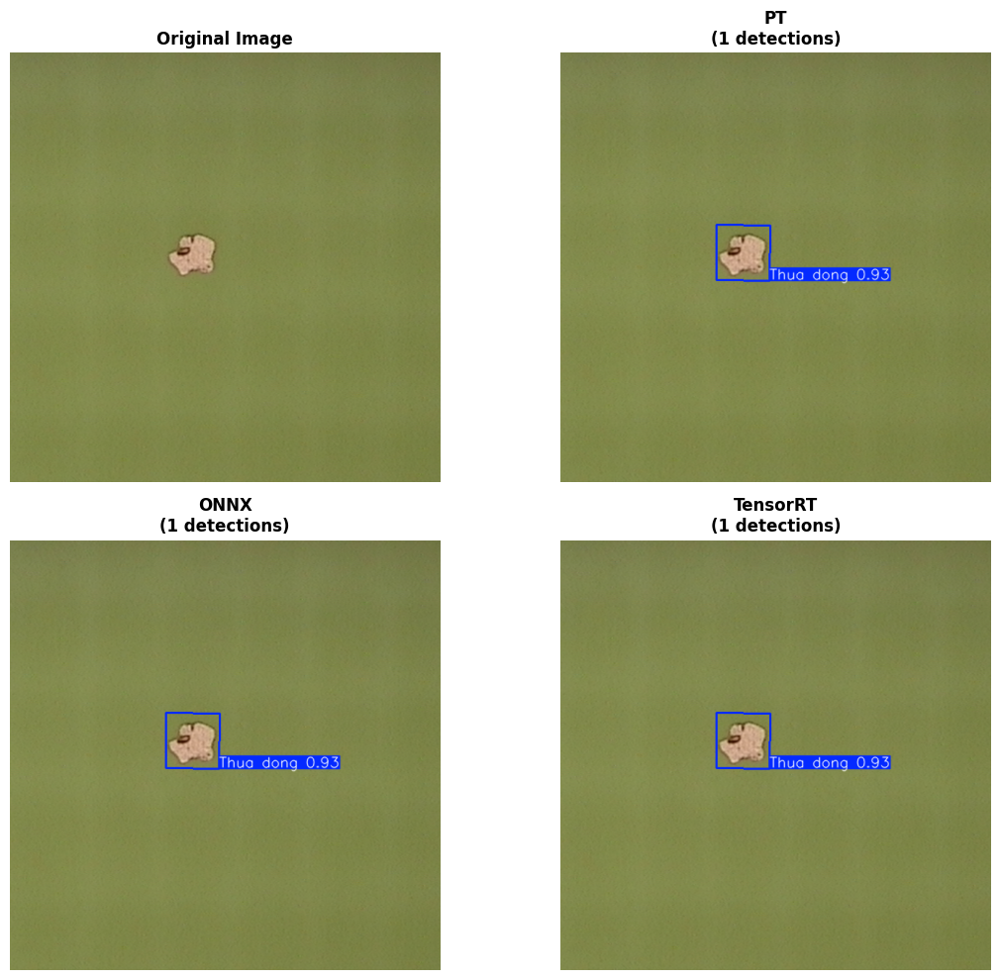

✅ Comparison grid saved: quality_comparison_results/comparison_grid.png

📈 QUALITY ANALYSIS

📊 Detection Count:
   PT: 1 objects
   ONNX: 1 objects
   TensorRT: 1 objects

🎯 Confidence Analysis:
   PT:
      Mean: 0.934
      Std:  0.000
      Min:  0.934
      Max:  0.934
      Range: 0.000
   ONNX:
      Mean: 0.934
      Std:  0.000
      Min:  0.934
      Max:  0.934
      Range: 0.000
   TensorRT:
      Mean: 0.934
      Std:  0.000
      Min:  0.934
      Max:  0.934
      Range: 0.000

📏 Object Size Analysis:
   PT:
      Small objects (<1000px²): 0
      Large objects (≥1000px²): 1
      Avg area: 5698.8px²
      Area range: 5698.8 - 5698.8px²
   ONNX:
      Small objects (<1000px²): 0
      Large objects (≥1000px²): 1
      Avg area: 5699.2px²
      Area range: 5699.2 - 5699.2px²
   TensorRT:
      Small objects (<1000px²): 0
      Large objects (≥1000px²): 1
      Avg area: 5693.4px²
      Area range: 5693.4 - 5693.4px²

🔄 Comparison vs PT (Baseline):
   ONNX vs PT:
      Det

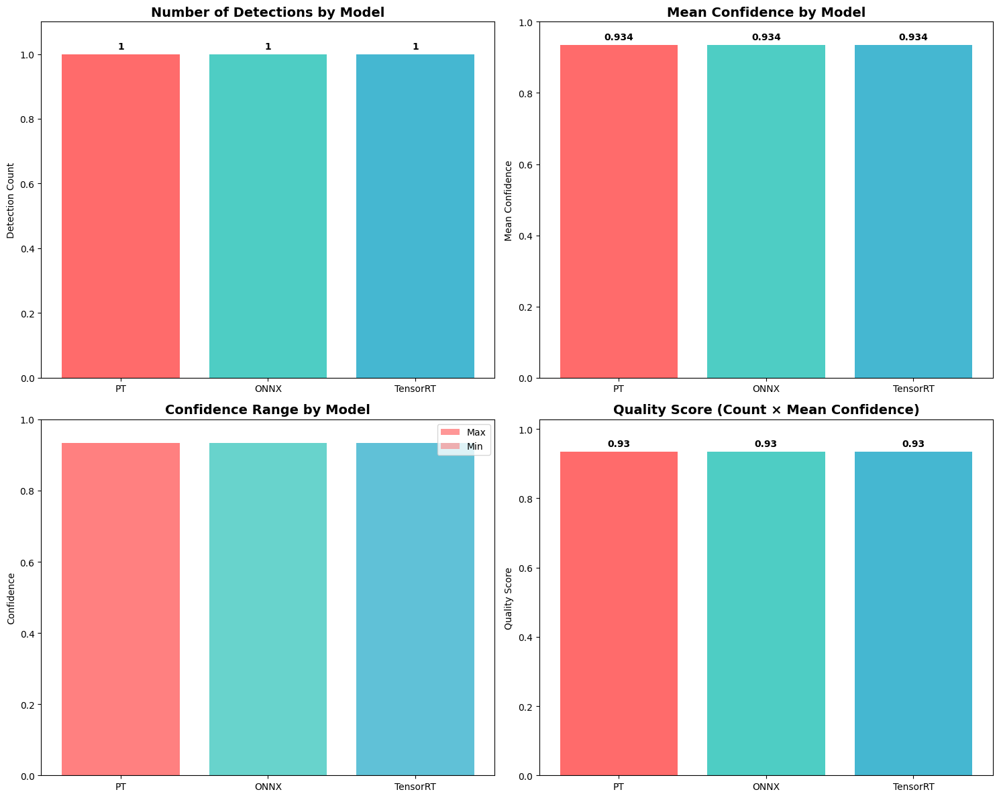

✅ Quality charts saved: quality_comparison_results/quality_charts.png

📝 Creating detailed annotations...
💾 Detailed annotation saved: quality_comparison_results/pt_detailed.jpg
💾 Detailed annotation saved: quality_comparison_results/onnx_detailed.jpg
💾 Detailed annotation saved: quality_comparison_results/tensorrt_detailed.jpg

📈 Creating confidence distribution plots...


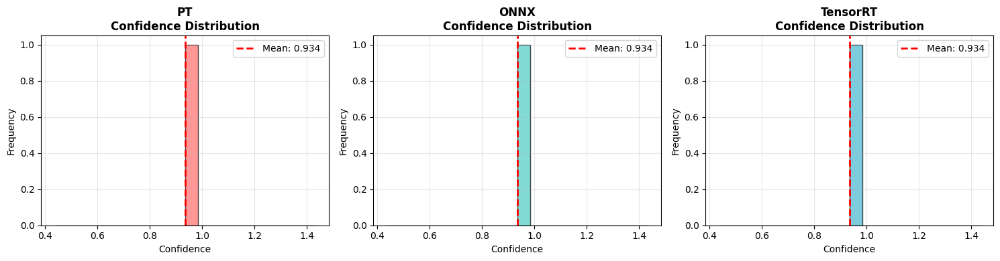

✅ Confidence distribution saved: quality_comparison_results/confidence_distribution.png
📝 Summary report saved: quality_comparison_results/quality_comparison_report.txt

🎉 Complete analysis finished!
📁 All results saved in: quality_comparison_results/
📸 Generated files:
   - Individual model results: pt_result.jpg, onnx_result.jpg, tensorrt_result.jpg
   - Detailed annotations: *_detailed.jpg
   - Comparison grid: comparison_grid.png
   - Quality charts: quality_charts.png
   - Confidence distribution: confidence_distribution.png
   - Summary report: quality_comparison_report.txt


In [29]:
import numpy as np
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os
from pathlib import Path

def compare_model_quality_with_images():
    """So sánh chất lượng giữa PT, ONNX, Engine với output ảnh"""
    
    # Paths
    pt_model = "/home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.pt"
    onnx_model = "/home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.onnx"
    engine_model = "/home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.engine"
    test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Thừa Đồng/110863-01 (2).jpg"
    
    # Create output directory
    output_dir = "quality_comparison_results"
    os.makedirs(output_dir, exist_ok=True)
    
    print("🔍 Quality Comparison Analysis with Visualizations")
    print("=" * 60)
    
    # Load original image
    original_image = cv2.imread(test_image)
    if original_image is None:
        print(f"❌ Cannot load image: {test_image}")
        return
    
    results = {}
    model_outputs = {}
    
    # Test PT model (baseline)
    try:
        print("\n📊 Testing PT Model (Baseline)...")
        pt_model_obj = YOLO(pt_model, task='obb')
        pt_results = pt_model_obj(test_image, conf=0.1, verbose=False, save=False)
        
        pt_detections = []
        if pt_results[0].obb is not None:
            for i, (box, conf, cls) in enumerate(zip(pt_results[0].obb.xywhr, pt_results[0].obb.conf, pt_results[0].obb.cls)):
                pt_detections.append({
                    'box': box.cpu().numpy(),
                    'confidence': float(conf),
                    'class': int(cls),
                    'area': float(box[2] * box[3])
                })
        
        results['PT'] = pt_detections
        
        # Create visualization
        pt_annotated = pt_results[0].plot()
        cv2.imwrite(f"{output_dir}/pt_result.jpg", pt_annotated)
        model_outputs['PT'] = pt_annotated
        
        print(f"✅ PT: {len(pt_detections)} detections")
        print(f"💾 Saved: {output_dir}/pt_result.jpg")
        
    except Exception as e:
        print(f"❌ PT model failed: {e}")
        results['PT'] = []
        model_outputs['PT'] = None
    
    # Test ONNX model
    try:
        print("\n📊 Testing ONNX Model...")
        # Using Ultralytics for ONNX for consistency
        onnx_model_obj = YOLO(onnx_model, task='obb')
        onnx_results = onnx_model_obj(test_image, conf=0.1, verbose=False, save=False)
        
        onnx_detections = []
        if onnx_results[0].obb is not None:
            for i, (box, conf, cls) in enumerate(zip(onnx_results[0].obb.xywhr, onnx_results[0].obb.conf, onnx_results[0].obb.cls)):
                onnx_detections.append({
                    'box': box.cpu().numpy(),
                    'confidence': float(conf),
                    'class': int(cls),
                    'area': float(box[2] * box[3])
                })
        
        results['ONNX'] = onnx_detections
        
        # Create visualization
        onnx_annotated = onnx_results[0].plot()
        cv2.imwrite(f"{output_dir}/onnx_result.jpg", onnx_annotated)
        model_outputs['ONNX'] = onnx_annotated
        
        print(f"✅ ONNX: {len(onnx_detections)} detections")
        print(f"💾 Saved: {output_dir}/onnx_result.jpg")
        
    except Exception as e:
        print(f"❌ ONNX model failed: {e}")
        results['ONNX'] = []
        model_outputs['ONNX'] = None
    
    # Test Engine model
    try:
        print("\n📊 Testing Engine Model...")
        engine_model_obj = YOLO(engine_model, task='obb')
        engine_results = engine_model_obj(test_image, conf=0.1, verbose=False, save=False)
        
        engine_detections = []
        if engine_results[0].obb is not None:
            for i, (box, conf, cls) in enumerate(zip(engine_results[0].obb.xywhr, engine_results[0].obb.conf, engine_results[0].obb.cls)):
                engine_detections.append({
                    'box': box.cpu().numpy(),
                    'confidence': float(conf),
                    'class': int(cls),
                    'area': float(box[2] * box[3])
                })
        
        results['TensorRT'] = engine_detections
        
        # Create visualization
        engine_annotated = engine_results[0].plot()
        cv2.imwrite(f"{output_dir}/tensorrt_result.jpg", engine_annotated)
        model_outputs['TensorRT'] = engine_annotated
        
        print(f"✅ TensorRT: {len(engine_detections)} detections")
        print(f"💾 Saved: {output_dir}/tensorrt_result.jpg")
        
    except Exception as e:
        print(f"❌ Engine model failed: {e}")
        results['TensorRT'] = []
        model_outputs['TensorRT'] = None
    
    # Create comparison visualization
    create_comparison_grid(original_image, model_outputs, results, output_dir)
    
    # Analysis
    print("\n" + "=" * 60)
    print("📈 QUALITY ANALYSIS")
    print("=" * 60)
    
    analyze_detection_quality(results)
    
    # Create charts
    create_quality_charts(results, output_dir)
    
    return results, model_outputs

def create_comparison_grid(original_image, model_outputs, results, output_dir):
    """Create a grid comparison of all model outputs"""
    
    print(f"\n🖼️ Creating comparison grid...")
    
    # Prepare images
    images = []
    titles = []
    
    # Original image
    original_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    images.append(original_rgb)
    titles.append("Original Image")
    
    # Model outputs
    for model_name, annotated_img in model_outputs.items():
        if annotated_img is not None:
            # Convert BGR to RGB for matplotlib
            annotated_rgb = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
            images.append(annotated_rgb)
            
            # Add detection count to title
            detection_count = len(results.get(model_name, []))
            titles.append(f"{model_name}\n({detection_count} detections)")
        else:
            # Create error placeholder
            error_img = np.zeros_like(original_rgb)
            cv2.putText(error_img, f"{model_name}", (50, 250), 
                       cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), 3)
            cv2.putText(error_img, "FAILED", (50, 350), 
                       cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 3)
            images.append(error_img)
            titles.append(f"{model_name}\n(Failed)")
    
    # Create subplot grid
    n_images = len(images)
    if n_images <= 2:
        rows, cols = 1, n_images
        figsize = (12, 6)
    elif n_images <= 4:
        rows, cols = 2, 2
        figsize = (12, 10)
    else:
        rows, cols = 2, 3
        figsize = (15, 10)
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if n_images == 1:
        axes = [axes]
    elif rows == 1:
        axes = axes
    else:
        axes = axes.flatten()
    
    # Plot images
    for i, (img, title) in enumerate(zip(images, titles)):
        if i < len(axes):
            axes[i].imshow(img)
            axes[i].set_title(title, fontsize=12, fontweight='bold')
            axes[i].axis('off')
    
    # Hide extra subplots
    for i in range(n_images, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    
    # Save comparison grid
    grid_path = f"{output_dir}/comparison_grid.png"
    plt.savefig(grid_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"✅ Comparison grid saved: {grid_path}")

def create_detailed_annotations(original_image, model_outputs, results, output_dir):
    """Create detailed annotations with confidence scores"""
    
    print(f"\n📝 Creating detailed annotations...")
    
    for model_name, detections in results.items():
        if not detections or model_outputs.get(model_name) is None:
            continue
        
        # Create detailed annotation
        detailed_img = original_image.copy()
        
        # Color scheme for different confidence levels
        colors = {
            'high': (0, 255, 0),    # Green for conf > 0.7
            'medium': (0, 255, 255), # Yellow for 0.4 < conf <= 0.7
            'low': (0, 0, 255)      # Red for conf <= 0.4
        }
        
        for i, detection in enumerate(detections):
            box = detection['box']  # [x_center, y_center, width, height, angle]
            conf = detection['confidence']
            cls = detection['class']
            
            # Determine color based on confidence
            if conf > 0.7:
                color = colors['high']
                conf_level = 'HIGH'
            elif conf > 0.4:
                color = colors['medium']
                conf_level = 'MED'
            else:
                color = colors['low']
                conf_level = 'LOW'
            
            # Convert OBB to rectangle points
            x_center, y_center, width, height = box[:4]
            angle = box[4] if len(box) > 4 else 0
            
            # Create rotated rectangle
            rect = ((x_center, y_center), (width, height), np.degrees(angle))
            box_points = cv2.boxPoints(rect).astype(int)
            
            # Draw rotated rectangle
            cv2.drawContours(detailed_img, [box_points], -1, color, 2)
            
            # Add detailed label
            label = f"#{i+1} C{cls} {conf:.3f} ({conf_level})"
            label_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)[0]
            
            # Label background
            label_x = int(x_center - label_size[0] // 2)
            label_y = int(y_center - height // 2 - 10)
            
            cv2.rectangle(detailed_img, 
                         (label_x - 5, label_y - label_size[1] - 5),
                         (label_x + label_size[0] + 5, label_y + 5),
                         color, -1)
            
            # Label text
            cv2.putText(detailed_img, label,
                       (label_x, label_y), cv2.FONT_HERSHEY_SIMPLEX, 0.6,
                       (255, 255, 255), 2)
        
        # Add summary info
        info_text = [
            f"Model: {model_name}",
            f"Detections: {len(detections)}",
            f"Avg Conf: {np.mean([d['confidence'] for d in detections]):.3f}",
            f"Min Conf: {np.min([d['confidence'] for d in detections]):.3f}",
            f"Max Conf: {np.max([d['confidence'] for d in detections]):.3f}"
        ]
        
        # Add info box
        info_y = 30
        for line in info_text:
            cv2.rectangle(detailed_img, (10, info_y - 20), (300, info_y + 5), (0, 0, 0), -1)
            cv2.putText(detailed_img, line, (15, info_y), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1)
            info_y += 25
        
        # Save detailed annotation
        detailed_path = f"{output_dir}/{model_name.lower()}_detailed.jpg"
        cv2.imwrite(detailed_path, detailed_img)
        print(f"💾 Detailed annotation saved: {detailed_path}")

def create_quality_charts(results, output_dir):
    """Create quality comparison charts"""
    
    print(f"\n📊 Creating quality charts...")
    
    # Prepare data
    model_names = []
    detection_counts = []
    mean_confidences = []
    min_confidences = []
    max_confidences = []
    
    for model_name, detections in results.items():
        if detections:
            model_names.append(model_name)
            detection_counts.append(len(detections))
            confidences = [d['confidence'] for d in detections]
            mean_confidences.append(np.mean(confidences))
            min_confidences.append(np.min(confidences))
            max_confidences.append(np.max(confidences))
    
    if not model_names:
        print("⚠️ No successful models to chart")
        return
    
    # Create charts
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7']
    
    # 1. Detection count bar chart
    bars1 = ax1.bar(model_names, detection_counts, color=colors[:len(model_names)])
    ax1.set_title('Number of Detections by Model', fontsize=14, fontweight='bold')
    ax1.set_ylabel('Detection Count')
    ax1.set_ylim(0, max(detection_counts) * 1.1 if detection_counts else 1)
    
    # Add value labels
    for bar, count in zip(bars1, detection_counts):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(detection_counts)*0.01,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    # 2. Mean confidence comparison
    bars2 = ax2.bar(model_names, mean_confidences, color=colors[:len(model_names)])
    ax2.set_title('Mean Confidence by Model', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Mean Confidence')
    ax2.set_ylim(0, 1)
    
    for bar, conf in zip(bars2, mean_confidences):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                f'{conf:.3f}', ha='center', va='bottom', fontweight='bold')
    
    # 3. Confidence range (min-max)
    x_pos = np.arange(len(model_names))
    ax3.bar(x_pos, max_confidences, color=colors[:len(model_names)], alpha=0.7, label='Max')
    ax3.bar(x_pos, min_confidences, color=colors[:len(model_names)], alpha=0.5, label='Min')
    ax3.set_title('Confidence Range by Model', fontsize=14, fontweight='bold')
    ax3.set_ylabel('Confidence')
    ax3.set_xticks(x_pos)
    ax3.set_xticklabels(model_names)
    ax3.set_ylim(0, 1)
    ax3.legend()
    
    # 4. Quality score (detection count * mean confidence)
    quality_scores = [count * conf for count, conf in zip(detection_counts, mean_confidences)]
    bars4 = ax4.bar(model_names, quality_scores, color=colors[:len(model_names)])
    ax4.set_title('Quality Score (Count × Mean Confidence)', fontsize=14, fontweight='bold')
    ax4.set_ylabel('Quality Score')
    ax4.set_ylim(0, max(quality_scores) * 1.1 if quality_scores else 1)
    
    for bar, score in zip(bars4, quality_scores):
        ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(quality_scores)*0.01,
                f'{score:.2f}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    
    # Save charts
    charts_path = f"{output_dir}/quality_charts.png"
    plt.savefig(charts_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"✅ Quality charts saved: {charts_path}")

def create_confidence_distribution(results, output_dir):
    """Create confidence distribution plots"""
    
    print(f"\n📈 Creating confidence distribution plots...")
    
    fig, axes = plt.subplots(1, len(results), figsize=(5*len(results), 4))
    if len(results) == 1:
        axes = [axes]
    
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']
    
    for i, (model_name, detections) in enumerate(results.items()):
        if detections and i < len(axes):
            confidences = [d['confidence'] for d in detections]
            
            # Histogram
            axes[i].hist(confidences, bins=20, color=colors[i % len(colors)], alpha=0.7, edgecolor='black')
            axes[i].set_title(f'{model_name}\nConfidence Distribution', fontweight='bold')
            axes[i].set_xlabel('Confidence')
            axes[i].set_ylabel('Frequency')
            axes[i].grid(True, alpha=0.3)
            
            # Add statistics
            mean_conf = np.mean(confidences)
            std_conf = np.std(confidences)
            axes[i].axvline(mean_conf, color='red', linestyle='--', linewidth=2, 
                           label=f'Mean: {mean_conf:.3f}')
            axes[i].legend()
        elif i < len(axes):
            axes[i].text(0.5, 0.5, f'{model_name}\nNo Detections', 
                        ha='center', va='center', transform=axes[i].transAxes,
                        fontsize=14, fontweight='bold')
            axes[i].set_title(f'{model_name}', fontweight='bold')
    
    plt.tight_layout()
    
    # Save distribution plots
    dist_path = f"{output_dir}/confidence_distribution.png"
    plt.savefig(dist_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"✅ Confidence distribution saved: {dist_path}")

def analyze_detection_quality(results):
    """Analyze detection quality differences with enhanced output"""
    
    # Detection count comparison
    print(f"\n📊 Detection Count:")
    for model_name, detections in results.items():
        print(f"   {model_name}: {len(detections)} objects")
    
    # Confidence analysis
    print(f"\n🎯 Confidence Analysis:")
    for model_name, detections in results.items():
        if detections:
            confidences = [d['confidence'] for d in detections]
            print(f"   {model_name}:")
            print(f"      Mean: {np.mean(confidences):.3f}")
            print(f"      Std:  {np.std(confidences):.3f}")
            print(f"      Min:  {np.min(confidences):.3f}")
            print(f"      Max:  {np.max(confidences):.3f}")
            print(f"      Range: {np.max(confidences) - np.min(confidences):.3f}")
        else:
            print(f"   {model_name}: No detections")
    
    # Size analysis
    print(f"\n📏 Object Size Analysis:")
    for model_name, detections in results.items():
        if detections:
            areas = [d['area'] for d in detections]
            small_objects = [a for a in areas if a < 1000]
            large_objects = [a for a in areas if a >= 1000]
            
            print(f"   {model_name}:")
            print(f"      Small objects (<1000px²): {len(small_objects)}")
            print(f"      Large objects (≥1000px²): {len(large_objects)}")
            if areas:
                print(f"      Avg area: {np.mean(areas):.1f}px²")
                print(f"      Area range: {np.min(areas):.1f} - {np.max(areas):.1f}px²")
    
    # Comparison against baseline (PT)
    if 'PT' in results and results['PT']:
        print(f"\n🔄 Comparison vs PT (Baseline):")
        
        pt_count = len(results['PT'])
        pt_confidences = [d['confidence'] for d in results['PT']]
        pt_mean_conf = np.mean(pt_confidences)
        
        for model_name, detections in results.items():
            if model_name == 'PT':
                continue
                
            if detections:
                # Detection count difference
                count_diff = len(detections) - pt_count
                count_pct = (count_diff / pt_count) * 100 if pt_count > 0 else 0
                
                # Confidence difference
                confidences = [d['confidence'] for d in detections]
                mean_conf = np.mean(confidences)
                conf_diff = mean_conf - pt_mean_conf
                
                print(f"   {model_name} vs PT:")
                print(f"      Detection count: {count_diff:+d} ({count_pct:+.1f}%)")
                print(f"      Mean confidence: {conf_diff:+.3f}")
                print(f"      Confidence ratio: {mean_conf/pt_mean_conf:.3f}x")
                
                # Quality assessment
                if count_diff < -2 or conf_diff < -0.1:
                    quality = "❌ Severely Degraded"
                elif count_diff < -1 or conf_diff < -0.05:
                    quality = "⚠️ Degraded"
                elif abs(count_diff) <= 1 and abs(conf_diff) < 0.02:
                    quality = "✅ Maintained"
                elif count_diff > 0 or conf_diff > 0.02:
                    quality = "🚀 Improved"
                else:
                    quality = "🔄 Changed"
                
                print(f"      Quality Assessment: {quality}")
            else:
                print(f"   {model_name}: ❌ No detections (severe degradation)")

def create_summary_report(results, model_outputs, output_dir):
    """Create comprehensive text summary report"""
    
    report_path = f"{output_dir}/quality_comparison_report.txt"
    
    with open(report_path, 'w') as f:
        f.write("QUALITY COMPARISON REPORT\n")
        f.write("=" * 50 + "\n\n")
        
        f.write("SUMMARY:\n")
        f.write("-" * 20 + "\n")
        
        # Overall summary
        successful_models = [name for name, detections in results.items() if detections]
        failed_models = [name for name, detections in results.items() if not detections]
        
        f.write(f"Successful models: {len(successful_models)}\n")
        f.write(f"Failed models: {len(failed_models)}\n\n")
        
        if successful_models:
            # Performance ranking
            model_scores = {}
            for model_name, detections in results.items():
                if detections:
                    confidences = [d['confidence'] for d in detections]
                    score = len(detections) * np.mean(confidences)
                    model_scores[model_name] = score
            
            sorted_models = sorted(model_scores.items(), key=lambda x: x[1], reverse=True)
            
            f.write("QUALITY RANKING:\n")
            f.write("-" * 20 + "\n")
            for i, (model_name, score) in enumerate(sorted_models, 1):
                emoji = ["🥇", "🥈", "🥉"][min(i-1, 2)]
                f.write(f"{emoji} {i}. {model_name}: {score:.3f}\n")
            f.write("\n")
        
        # Detailed results
        f.write("DETAILED RESULTS:\n")
        f.write("-" * 20 + "\n")
        
        for model_name, detections in results.items():
            f.write(f"\n{model_name}:\n")
            if detections:
                confidences = [d['confidence'] for d in detections]
                areas = [d['area'] for d in detections]
                
                f.write(f"  Detections: {len(detections)}\n")
                f.write(f"  Mean Confidence: {np.mean(confidences):.3f}\n")
                f.write(f"  Confidence Range: {np.min(confidences):.3f} - {np.max(confidences):.3f}\n")
                f.write(f"  Mean Area: {np.mean(areas):.1f}px²\n")
                f.write(f"  Status: Success\n")
            else:
                f.write(f"  Status: Failed or No Detections\n")
        
        f.write(f"\nGenerated files:\n")
        f.write(f"- Individual results: pt_result.jpg, onnx_result.jpg, tensorrt_result.jpg\n")
        f.write(f"- Comparison grid: comparison_grid.png\n")
        f.write(f"- Quality charts: quality_charts.png\n")
        f.write(f"- Confidence distribution: confidence_distribution.png\n")
    
    print(f"📝 Summary report saved: {report_path}")

# Main execution function
def run_complete_quality_analysis():
    """Run complete quality analysis with all visualizations"""
    
    print("🚀 Starting Complete Quality Analysis")
    print("=" * 60)
    
    try:
        # Run comparison
        results, model_outputs = compare_model_quality_with_images()
        
        if not any(results.values()):
            print("❌ No successful model results to analyze")
            return
        
        output_dir = "quality_comparison_results"
        
        # Create additional visualizations
        create_detailed_annotations(cv2.imread("/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Thừa Đồng/110863-01 (2).jpg"), 
                                  model_outputs, results, output_dir)
        create_confidence_distribution(results, output_dir)
        create_summary_report(results, model_outputs, output_dir)
        
        print(f"\n🎉 Complete analysis finished!")
        print(f"📁 All results saved in: {output_dir}/")
        print(f"📸 Generated files:")
        print(f"   - Individual model results: pt_result.jpg, onnx_result.jpg, tensorrt_result.jpg")
        print(f"   - Detailed annotations: *_detailed.jpg")
        print(f"   - Comparison grid: comparison_grid.png")
        print(f"   - Quality charts: quality_charts.png")
        print(f"   - Confidence distribution: confidence_distribution.png")
        print(f"   - Summary report: quality_comparison_report.txt")
        
    except Exception as e:
        print(f"❌ Analysis failed: {e}")
        import traceback
        traceback.print_exc()

# Run the complete analysis
if __name__ == "__main__":
    run_complete_quality_analysis()

In [ ]:
import os
import time
import cv2
import numpy as np
import threading
import concurrent.futures
from queue import Queue
import tensorrt as trt
import pycuda.driver as cuda
import pycuda.autoinit
from ultralytics import YOLO
import json
from pathlib import Path

class MultiEngineInference:
    def __init__(self, engine_paths, engine_names=None):
        """
        Initialize multiple TensorRT engines for parallel inference
        
        Args:
            engine_paths: List of paths to .engine files
            engine_names: Optional list of names for engines
        """
        self.engine_paths = engine_paths
        self.engine_names = engine_names or [f"Model_{i+1}" for i in range(len(engine_paths))]
        self.engines = {}
        self.contexts = {}
        self.models = {}  # For Ultralytics wrapper
        
        print("🚀 Initializing Multi-Engine Inference System")
        print("=" * 60)
        
        self.load_all_engines()
    
    def load_all_engines(self):
        """Load all TensorRT engines"""
        
        for i, (engine_path, engine_name) in enumerate(zip(self.engine_paths, self.engine_names)):
            print(f"\n🔄 Loading Engine {i+1}/{len(self.engine_paths)}: {engine_name}")
            
            if not os.path.exists(engine_path):
                print(f"❌ Engine not found: {engine_path}")
                continue
            
            try:
                # Method 1: Using Ultralytics (Easier)
                model = YOLO(engine_path, task='obb')
                self.models[engine_name] = model
                print(f"✅ Loaded via Ultralytics: {engine_name}")
                
            except Exception as e:
                print(f"⚠️ Ultralytics failed for {engine_name}: {e}")
                
                try:
                    # Method 2: Native TensorRT (More control)
                    self.load_native_engine(engine_path, engine_name)
                    print(f"✅ Loaded via Native TensorRT: {engine_name}")
                    
                except Exception as e2:
                    print(f"❌ Both methods failed for {engine_name}: {e2}")
                    continue
        
        print(f"\n✅ Successfully loaded {len(self.models) + len(self.engines)} engines")
    
    def load_native_engine(self, engine_path, engine_name):
        """Load engine using native TensorRT API"""
        
        TRT_LOGGER = trt.Logger(trt.Logger.WARNING)
        runtime = trt.Runtime(TRT_LOGGER)
        
        with open(engine_path, 'rb') as f:
            engine_data = f.read()
        
        engine = runtime.deserialize_cuda_engine(engine_data)
        context = engine.create_execution_context()
        
        self.engines[engine_name] = engine
        self.contexts[engine_name] = context
    
    def preprocess_image(self, image_path, target_size=640):
        """Preprocess image for inference"""
        
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Cannot load image: {image_path}")
        
        # Convert BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Resize with padding
        h, w = image_rgb.shape[:2]
        scale = min(target_size / h, target_size / w)
        new_h, new_w = int(h * scale), int(w * scale)
        
        resized = cv2.resize(image_rgb, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
        
        # Pad image
        padded = np.full((target_size, target_size, 3), 114, dtype=np.uint8)
        pad_h = (target_size - new_h) // 2
        pad_w = (target_size - new_w) // 2
        padded[pad_h:pad_h + new_h, pad_w:pad_w + new_w] = resized
        
        # Normalize and format
        normalized = padded.astype(np.float32) / 255.0
        chw = np.transpose(normalized, (2, 0, 1))
        batch = np.expand_dims(chw, axis=0)
        
        return np.ascontiguousarray(batch), scale, pad_h, pad_w, image
    
    def infer_single_engine_ultralytics(self, engine_name, image_path, conf_threshold=0.25):
        """Infer using single engine via Ultralytics"""
        
        try:
            start_time = time.time()
            
            model = self.models[engine_name]
            results = model(image_path, conf=conf_threshold, verbose=False)
            
            inference_time = (time.time() - start_time) * 1000
            
            # Extract detections
            detections = []
            if results[0].obb is not None:
                for box, conf, cls in zip(results[0].obb.xywhr, results[0].obb.conf, results[0].obb.cls):
                    detections.append({
                        'box': box.cpu().numpy().tolist(),
                        'confidence': float(conf),
                        'class': int(cls)
                    })
            elif results[0].boxes is not None:
                for box, conf, cls in zip(results[0].boxes.xywh, results[0].boxes.conf, results[0].boxes.cls):
                    detections.append({
                        'box': box.cpu().numpy().tolist(),
                        'confidence': float(conf),
                        'class': int(cls)
                    })
            
            return {
                'engine_name': engine_name,
                'status': 'success',
                'inference_time_ms': inference_time,
                'num_detections': len(detections),
                'detections': detections,
                'results_obj': results[0]  # For visualization
            }
            
        except Exception as e:
            return {
                'engine_name': engine_name,
                'status': 'failed',
                'error': str(e),
                'inference_time_ms': 0,
                'num_detections': 0,
                'detections': []
            }
    
    def infer_single_engine_native(self, engine_name, preprocessed_tensor):
        """Infer using single engine via Native TensorRT"""
        
        try:
            start_time = time.time()
            
            engine = self.engines[engine_name]
            context = self.contexts[engine_name]
            
            # Get binding info
            try:
                input_shape = engine.get_binding_shape(0)
                output_shape = engine.get_binding_shape(1)
                input_name = engine.get_binding_name(0)
                output_name = engine.get_binding_name(1)
            except:
                # New TensorRT API
                input_name = engine.get_tensor_name(0)
                output_name = engine.get_tensor_name(1)
                input_shape = engine.get_tensor_shape(input_name)
                output_shape = engine.get_tensor_shape(output_name)
            
            # Allocate GPU memory
            input_size = int(np.prod(input_shape) * np.float32().itemsize)
            output_size = int(np.prod(output_shape) * np.float32().itemsize)
            
            input_buffer = cuda.mem_alloc(input_size)
            output_buffer = cuda.mem_alloc(output_size)
            stream = cuda.Stream()
            
            # Copy input to GPU
            cuda.memcpy_htod_async(input_buffer, preprocessed_tensor, stream)
            
            # Execute inference
            try:
                bindings = [int(input_buffer), int(output_buffer)]
                context.execute_async_v2(bindings=bindings, stream_handle=stream.handle)
            except:
                context.set_tensor_address(input_name, int(input_buffer))
                context.set_tensor_address(output_name, int(output_buffer))
                context.execute_async_v3(stream_handle=stream.handle)
            
            # Copy output from GPU
            output = np.empty(output_shape, dtype=np.float32)
            cuda.memcpy_dtoh_async(output, output_buffer, stream)
            stream.synchronize()
            
            inference_time = (time.time() - start_time) * 1000
            
            # Cleanup
            input_buffer.free()
            output_buffer.free()
            
            return {
                'engine_name': engine_name,
                'status': 'success',
                'inference_time_ms': inference_time,
                'raw_output': output,
                'output_shape': output_shape
            }
            
        except Exception as e:
            return {
                'engine_name': engine_name,
                'status': 'failed',
                'error': str(e),
                'inference_time_ms': 0
            }
    
    def parallel_inference_ultralytics(self, image_path, conf_threshold=0.25, max_workers=None):
        """Run parallel inference using Ultralytics wrapper"""
        
        print(f"\n🚀 Running Parallel Inference (Ultralytics)")
        print(f"📸 Image: {image_path}")
        print(f"🎯 Confidence threshold: {conf_threshold}")
        print(f"🧵 Engines: {len(self.models)}")
        
        if not self.models:
            print("❌ No engines loaded")
            return {}
        
        start_time = time.time()
        results = {}
        
        # Use ThreadPoolExecutor for parallel execution
        max_workers = max_workers or min(len(self.models), 5)
        
        with concurrent.futures.ThreadPoolExecutor(max_workers=max_workers) as executor:
            # Submit all inference tasks
            future_to_engine = {
                executor.submit(self.infer_single_engine_ultralytics, engine_name, image_path, conf_threshold): engine_name
                for engine_name in self.models.keys()
            }
            
            # Collect results as they complete
            for future in concurrent.futures.as_completed(future_to_engine):
                engine_name = future_to_engine[future]
                try:
                    result = future.result()
                    results[engine_name] = result
                    
                    if result['status'] == 'success':
                        print(f"✅ {engine_name}: {result['inference_time_ms']:.2f}ms, {result['num_detections']} detections")
                    else:
                        print(f"❌ {engine_name}: {result['error']}")
                        
                except Exception as e:
                    print(f"❌ {engine_name}: Exception occurred: {e}")
                    results[engine_name] = {
                        'engine_name': engine_name,
                        'status': 'failed',
                        'error': str(e)
                    }
        
        total_time = (time.time() - start_time) * 1000
        
        print(f"\n📊 Parallel Inference Completed:")
        print(f"   Total time: {total_time:.2f}ms")
        print(f"   Successful: {sum(1 for r in results.values() if r['status'] == 'success')}/{len(results)}")
        
        return results
    
    def parallel_inference_mixed(self, image_path, conf_threshold=0.25):
        """Run parallel inference using both Ultralytics and Native methods"""
        
        print(f"\n🚀 Running Mixed Parallel Inference")
        print(f"📸 Image: {image_path}")
        
        # Preprocess image once for native engines
        try:
            preprocessed_tensor, scale, pad_h, pad_w, original_image = self.preprocess_image(image_path)
        except Exception as e:
            print(f"❌ Image preprocessing failed: {e}")
            return {}
        
        start_time = time.time()
        results = {}
        
        # Create thread pool
        with concurrent.futures.ThreadPoolExecutor(max_workers=5) as executor:
            futures = []
            
            # Submit Ultralytics engines
            for engine_name in self.models.keys():
                future = executor.submit(self.infer_single_engine_ultralytics, engine_name, image_path, conf_threshold)
                futures.append((future, engine_name, 'ultralytics'))
            
            # Submit Native engines
            for engine_name in self.engines.keys():
                future = executor.submit(self.infer_single_engine_native, engine_name, preprocessed_tensor)
                futures.append((future, engine_name, 'native'))
            
            # Collect results
            for future, engine_name, method in futures:
                try:
                    result = future.result()
                    result['method'] = method
                    results[engine_name] = result
                    
                    if result['status'] == 'success':
                        print(f"✅ {engine_name} ({method}): {result['inference_time_ms']:.2f}ms")
                    else:
                        print(f"❌ {engine_name} ({method}): {result.get('error', 'Unknown error')}")
                        
                except Exception as e:
                    print(f"❌ {engine_name}: Exception: {e}")
                    results[engine_name] = {'status': 'failed', 'error': str(e)}
        
        total_time = (time.time() - start_time) * 1000
        successful_count = sum(1 for r in results.values() if r['status'] == 'success')
        
        print(f"\n📊 Mixed Inference Completed:")
        print(f"   Total time: {total_time:.2f}ms")
        print(f"   Successful: {successful_count}/{len(results)}")
        
        return results
    
    def create_ensemble_result(self, results, ensemble_method='voting'):
        """Create ensemble result from multiple model outputs"""
        
        print(f"\n🤝 Creating Ensemble Result ({ensemble_method})")
        
        successful_results = {k: v for k, v in results.items() if v['status'] == 'success' and v['num_detections'] > 0}
        
        if not successful_results:
            print("❌ No successful detections for ensemble")
            return None
        
        if ensemble_method == 'voting':
            # Simple voting: take detections that appear in multiple models
            all_detections = []
            
            for engine_name, result in successful_results.items():
                for detection in result['detections']:
                    detection['source_model'] = engine_name
                    all_detections.append(detection)
            
            print(f"📊 Ensemble Summary:")
            print(f"   Models used: {len(successful_results)}")
            print(f"   Total detections: {len(all_detections)}")
            
            return {
                'method': ensemble_method,
                'models_used': list(successful_results.keys()),
                'total_detections': len(all_detections),
                'all_detections': all_detections
            }
        
        elif ensemble_method == 'best_confidence':
            # Take the model with highest average confidence
            best_model = None
            best_avg_conf = 0
            
            for engine_name, result in successful_results.items():
                if result['detections']:
                    avg_conf = np.mean([d['confidence'] for d in result['detections']])
                    if avg_conf > best_avg_conf:
                        best_avg_conf = avg_conf
                        best_model = engine_name
            
            if best_model:
                print(f"🏆 Best model: {best_model} (avg conf: {best_avg_conf:.3f})")
                return {
                    'method': ensemble_method,
                    'best_model': best_model,
                    'best_result': successful_results[best_model]
                }
        
        return None
    
    def save_results(self, results, output_dir="parallel_inference_results"):
        """Save inference results and visualizations"""
        
        os.makedirs(output_dir, exist_ok=True)
        
        print(f"\n💾 Saving Results to: {output_dir}")
        
        # Save JSON results
        json_results = {}
        for engine_name, result in results.items():
            # Remove objects that can't be serialized
            clean_result = {k: v for k, v in result.items() if k != 'results_obj'}
            json_results[engine_name] = clean_result
        
        json_path = os.path.join(output_dir, "inference_results.json")
        with open(json_path, 'w') as f:
            json.dump(json_results, f, indent=2)
        print(f"📄 JSON results: {json_path}")
        
        # Save visualizations
        for engine_name, result in results.items():
            if result['status'] == 'success' and 'results_obj' in result:
                try:
                    annotated = result['results_obj'].plot()
                    output_path = os.path.join(output_dir, f"{engine_name}_result.jpg")
                    cv2.imwrite(output_path, annotated)
                    print(f"🖼️ {engine_name} visualization: {output_path}")
                except Exception as e:
                    print(f"⚠️ Failed to save {engine_name} visualization: {e}")
        
        # Create comparison visualization
        self.create_comparison_visualization(results, output_dir)
        
        # Create summary report
        self.create_summary_report(results, output_dir)
    
    def create_comparison_visualization(self, results, output_dir):
        """Create side-by-side comparison of all results"""
        
        import matplotlib.pyplot as plt
        
        successful_results = [(k, v) for k, v in results.items() if v['status'] == 'success' and 'results_obj' in v]
        
        if not successful_results:
            return
        
        n_models = len(successful_results)
        cols = min(3, n_models)
        rows = (n_models + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
        if n_models == 1:
            axes = [axes]
        elif rows == 1:
            axes = axes
        else:
            axes = axes.flatten()
        
        for i, (engine_name, result) in enumerate(successful_results):
            if i < len(axes):
                try:
                    # Get annotated image
                    annotated = result['results_obj'].plot()
                    annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
                    
                    axes[i].imshow(annotated_rgb)
                    axes[i].set_title(f"{engine_name}\n{result['num_detections']} detections\n{result['inference_time_ms']:.1f}ms")
                    axes[i].axis('off')
                except Exception as e:
                    axes[i].text(0.5, 0.5, f"{engine_name}\nVisualization Error", 
                               ha='center', va='center', transform=axes[i].transAxes)
                    axes[i].axis('off')
        
        # Hide extra subplots
        for i in range(n_models, len(axes)):
            axes[i].axis('off')
        
        plt.tight_layout()
        comparison_path = os.path.join(output_dir, "comparison_grid.png")
        plt.savefig(comparison_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"📊 Comparison grid: {comparison_path}")
    
    def create_summary_report(self, results, output_dir):
        """Create text summary report"""
        
        report_path = os.path.join(output_dir, "summary_report.txt")
        
        with open(report_path, 'w') as f:
            f.write("PARALLEL INFERENCE SUMMARY REPORT\n")
            f.write("=" * 50 + "\n\n")
            
            # Overall statistics
            successful = [r for r in results.values() if r['status'] == 'success']
            failed = [r for r in results.values() if r['status'] == 'failed']
            
            f.write(f"Total Engines: {len(results)}\n")
            f.write(f"Successful: {len(successful)}\n")
            f.write(f"Failed: {len(failed)}\n\n")
            
            if successful:
                # Performance statistics
                inference_times = [r['inference_time_ms'] for r in successful]
                total_detections = sum(r['num_detections'] for r in successful)
                
                f.write("PERFORMANCE STATISTICS:\n")
                f.write("-" * 30 + "\n")
                f.write(f"Average inference time: {np.mean(inference_times):.2f}ms\n")
                f.write(f"Fastest inference: {np.min(inference_times):.2f}ms\n")
                f.write(f"Slowest inference: {np.max(inference_times):.2f}ms\n")
                f.write(f"Total detections: {total_detections}\n")
                f.write(f"Average detections per model: {total_detections/len(successful):.1f}\n\n")
                
                # Individual results
                f.write("INDIVIDUAL RESULTS:\n")
                f.write("-" * 30 + "\n")
                
                # Sort by inference time
                sorted_results = sorted([(k, v) for k, v in results.items() if v['status'] == 'success'], 
                                      key=lambda x: x[1]['inference_time_ms'])
                
                for i, (engine_name, result) in enumerate(sorted_results, 1):
                    f.write(f"{i}. {engine_name}:\n")
                    f.write(f"   Time: {result['inference_time_ms']:.2f}ms\n")
                    f.write(f"   Detections: {result['num_detections']}\n")
                    if result['detections']:
                        confidences = [d['confidence'] for d in result['detections']]
                        f.write(f"   Avg Confidence: {np.mean(confidences):.3f}\n")
                    f.write("\n")
            
            if failed:
                f.write("FAILED ENGINES:\n")
                f.write("-" * 30 + "\n")
                for engine_name, result in results.items():
                    if result['status'] == 'failed':
                        f.write(f"- {engine_name}: {result.get('error', 'Unknown error')}\n")
        
        print(f"📝 Summary report: {report_path}")

# Example usage function
def setup_multi_engine_inference():
    """Setup example with 5 engine files"""
    
    # Example engine paths - adjust these to your actual paths
    engine_paths = [
        "/home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.engine", 
        "/home/jkl0909/TestCycletimeMeiko/Modelx/khuyetmach.engine",
        "/home/jkl0909/TestCycletimeMeiko/Modelx/nganmach.engine",
        "/home/jkl0909/TestCycletimeMeiko/Modelx/vetlom.engine",
        "/home/jkl0909/TestCycletimeMeiko/xuoc/xuoc.engine"
    ]
    
    engine_names = [
        "ThuaDong",
        "KhuyetMach",
        "NganMach",
        "VetLom",
        "Xuoc"
    ]
    
    # Filter existing engines
    existing_engines = []
    existing_names = []
    
    for path, name in zip(engine_paths, engine_names):
        if os.path.exists(path):
            existing_engines.append(path)
            existing_names.append(name)
        else:
            print(f"⚠️ Engine not found: {path}")
    
    if not existing_engines:
        print("❌ No engine files found!")
        return None
    
    # Initialize multi-engine inference
    multi_engine = MultiEngineInference(existing_engines, existing_names)
    
    return multi_engine

def run_parallel_inference_demo():
    """Run demo of parallel inference"""
    
    print("🚀 Multi-Engine Parallel Inference Demo")
    print("=" * 60)
    
    # Setup
    multi_engine = setup_multi_engine_inference()
    if not multi_engine:
        return
    
    # Test image
    test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Thừa Đồng/110863-01 (2).jpg"
    
    if not os.path.exists(test_image):
        print(f"❌ Test image not found: {test_image}")
        return
    
    # Run parallel inference
    results = multi_engine.parallel_inference_ultralytics(test_image, conf_threshold=0.25)
    
    # Create ensemble result
    ensemble = multi_engine.create_ensemble_result(results, ensemble_method='best_confidence')
    
    # Save results
    multi_engine.save_results(results)
    
    print(f"\n🎉 Demo completed! Check 'parallel_inference_results' folder for outputs.")

# Run the demo
if __name__ == "__main__":
    run_parallel_inference_demo()

🚀 Multi-Engine Parallel Inference Demo
🚀 Initializing Multi-Engine Inference System

🔄 Loading Engine 1/5: ThuaDong
✅ Loaded via Ultralytics: ThuaDong

🔄 Loading Engine 2/5: KhuyetMach
✅ Loaded via Ultralytics: KhuyetMach

🔄 Loading Engine 3/5: NganMach
✅ Loaded via Ultralytics: NganMach

🔄 Loading Engine 4/5: VetLom
✅ Loaded via Ultralytics: VetLom

🔄 Loading Engine 5/5: Xuoc
✅ Loaded via Ultralytics: Xuoc

✅ Successfully loaded 5 engines

🚀 Running Parallel Inference (Ultralytics)
📸 Image: /home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/Thừa Đồng/110863-01 (2).jpg
🎯 Confidence threshold: 0.25
🧵 Engines: 5
Loading /home/jkl0909/TestCycletimeMeiko/Modelx/thuadong.engine for TensorRT inference...
[06/17/2025-17:27:47] [TRT] [I] The logger passed into createInferRuntime differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
Loading /home/jkl0909/TestCycletimeMeiko

In [ ]:
#!/usr/bin/env python3
"""
SAM Test Script - Test SAM 2.1 Small Engine (Fixed)
Usage: python test_sam_fixed.py
"""

import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def test_sam_native_tensorrt():
    """Test SAM using Native TensorRT with proper API"""
    
    print("🔧 Testing SAM with Native TensorRT (Fixed)")
    print("=" * 50)
    
    try:
        import tensorrt as trt
        import pycuda.driver as cuda
        import pycuda.autoinit
        
        # Paths
        sam_engine = "/home/jkl0909/TestCycletimeMeiko/sam2.1_small.engine"
        test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/thuadong/testthuadong.jpg"
        
        # Load engine
        print("? Loading TensorRT engine...")
        trt_logger = trt.Logger(trt.Logger.WARNING)
        runtime = trt.Runtime(trt_logger)
        
        with open(sam_engine, 'rb') as f:
            engine_data = f.read()
            
        engine = runtime.deserialize_cuda_engine(engine_data)
        if engine is None:
            print("❌ Failed to deserialize engine")
            return False
            
        context = engine.create_execution_context()
        print("✅ Engine loaded successfully!")
        
        # Get engine info using compatible API
        print("\n📊 Engine Information:")
        
        # Use compatible API calls
        try:
            # New TensorRT API
            num_io_tensors = engine.num_io_tensors
            print(f"   Number of IO tensors: {num_io_tensors}")
            
            # Get tensor names and info
            input_tensors = []
            output_tensors = []
            
            for i in range(num_io_tensors):
                tensor_name = engine.get_tensor_name(i)
                tensor_mode = engine.get_tensor_mode(tensor_name)
                tensor_shape = engine.get_tensor_shape(tensor_name)
                tensor_dtype = engine.get_tensor_dtype(tensor_name)
                
                if tensor_mode == trt.TensorIOMode.INPUT:
                    input_tensors.append(tensor_name)
                    print(f"   INPUT - {tensor_name}:")
                    print(f"     Shape: {tensor_shape}")
                    print(f"     Type: {tensor_dtype}")
                else:
                    output_tensors.append(tensor_name)
                    print(f"   OUTPUT - {tensor_name}:")
                    print(f"     Shape: {tensor_shape}")
                    print(f"     Type: {tensor_dtype}")
                    
        except AttributeError:
            # Fallback to old API
            try:
                num_bindings = engine.num_bindings
                print(f"   Number of bindings: {num_bindings}")
                
                input_tensors = []
                output_tensors = []
                
                for i in range(num_bindings):
                    name = engine.get_binding_name(i)
                    shape = engine.get_binding_shape(i)
                    dtype = engine.get_binding_dtype(i)
                    is_input = engine.binding_is_input(i)
                    
                    if is_input:
                        input_tensors.append(name)
                        print(f"   INPUT - {name}:")
                    else:
                        output_tensors.append(name)
                        print(f"   OUTPUT - {name}:")
                    
                    print(f"     Shape: {shape}")
                    print(f"     Type: {dtype}")
                    
            except Exception as e:
                print(f"   ⚠️ Could not get detailed engine info: {e}")
                return False
        
        # Load and preprocess image
        print("\n🖼️ Processing image...")
        image = cv2.imread(test_image)
        if image is None:
            print("❌ Failed to load image")
            return False
            
        original_shape = image.shape
        print(f"   Original size: {original_shape}")
        
        # SAM preprocessing
        target_size = 1024  # SAM typically uses 1024x1024
        
        # Resize while maintaining aspect ratio
        h, w = image.shape[:2]
        scale = target_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        
        # Resize image
        resized = cv2.resize(image, (new_w, new_h))
        
        # Pad to square
        padded = np.zeros((target_size, target_size, 3), dtype=np.uint8)
        y_offset = (target_size - new_h) // 2
        x_offset = (target_size - new_w) // 2
        padded[y_offset:y_offset + new_h, x_offset:x_offset + new_w] = resized
        
        # Convert to RGB and normalize
        image_rgb = cv2.cvtColor(padded, cv2.COLOR_BGR2RGB)
        image_normalized = image_rgb.astype(np.float32) / 255.0
        
        # Convert to CHW format and add batch dimension
        image_chw = np.transpose(image_normalized, (2, 0, 1))
        image_batch = np.expand_dims(image_chw, axis=0)
        
        print(f"   Preprocessed shape: {image_batch.shape}")
        print(f"   Scale factor: {scale:.4f}")
        print(f"   Padding: ({x_offset}, {y_offset})")
        
        # Prepare inputs for inference
        print("\n🚀 Preparing for inference...")
        
        if len(input_tensors) > 0:
            print(f"   Found {len(input_tensors)} input tensor(s)")
            print(f"   Found {len(output_tensors)} output tensor(s)")
            
            # Basic validation that we can set up inference
            try:
                # Allocate memory for first input (image)
                if len(input_tensors) > 0:
                    first_input = input_tensors[0]
                    
                    try:
                        input_shape = engine.get_tensor_shape(first_input)
                    except:
                        input_shape = engine.get_binding_shape(0)
                    
                    input_size = int(np.prod(input_shape) * 4)  # float32
                    print(f"   Input memory needed: {input_size} bytes")
                    
                    # Test memory allocation
                    input_buffer = cuda.mem_alloc(input_size)
                    print("✅ Memory allocation successful")
                    input_buffer.free()
                    
                print("✅ Engine validation completed successfully!")
                
                # Save preprocessing result
                output_dir = "sam_test_results"
                os.makedirs(output_dir, exist_ok=True)
                
                plt.figure(figsize=(12, 4))
                
                plt.subplot(1, 3, 1)
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                plt.title("Original Image")
                plt.axis('off')
                
                plt.subplot(1, 3, 2)
                plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
                plt.title(f"Resized ({new_w}x{new_h})")
                plt.axis('off')
                
                plt.subplot(1, 3, 3)
                plt.imshow(image_rgb)
                plt.title(f"Preprocessed ({target_size}x{target_size})")
                plt.axis('off')
                
                plt.tight_layout()
                plt.savefig(f"{output_dir}/sam_preprocessing.png", dpi=150, bbox_inches='tight')
                plt.close()
                
                print(f"💾 Preprocessing visualization saved to {output_dir}/sam_preprocessing.png")
                
                return True
                
            except Exception as e:
                print(f"⚠️ Inference preparation failed: {e}")
                return False
        else:
            print("⚠️ No input tensors found")
            return False
        
    except ImportError as e:
        print(f"❌ TensorRT not available: {e}")
        return False
    except Exception as e:
        print(f"❌ Native inference test failed: {e}")
        return False

def run_basic_sam_inference():
    """Attempt basic SAM inference with the engine"""
    
    print("\n? Attempting Basic SAM Inference")
    print("=" * 40)
    
    try:
        import tensorrt as trt
        import pycuda.driver as cuda
        import pycuda.autoinit
        
        sam_engine = "/home/jkl0909/TestCycletimeMeiko/sam2.1_small.engine"
        test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/thuadong/testthuadong.jpg"
        
        # Load engine
        trt_logger = trt.Logger(trt.Logger.WARNING)
        runtime = trt.Runtime(trt_logger)
        
        with open(sam_engine, 'rb') as f:
            engine_data = f.read()
            
        engine = runtime.deserialize_cuda_engine(engine_data)
        context = engine.create_execution_context()
        
        # Get tensor info
        try:
            # New API
            input_names = [engine.get_tensor_name(i) for i in range(engine.num_io_tensors) 
                          if engine.get_tensor_mode(engine.get_tensor_name(i)) == trt.TensorIOMode.INPUT]
            output_names = [engine.get_tensor_name(i) for i in range(engine.num_io_tensors) 
                           if engine.get_tensor_mode(engine.get_tensor_name(i)) == trt.TensorIOMode.OUTPUT]
            
            # Get shapes
            input_shapes = {name: engine.get_tensor_shape(name) for name in input_names}
            output_shapes = {name: engine.get_tensor_shape(name) for name in output_names}
            
        except AttributeError:
            # Old API fallback
            input_names = [engine.get_binding_name(i) for i in range(engine.num_bindings) if engine.binding_is_input(i)]
            output_names = [engine.get_binding_name(i) for i in range(engine.num_bindings) if not engine.binding_is_input(i)]
            
            input_shapes = {name: engine.get_binding_shape(engine.get_binding_index(name)) for name in input_names}
            output_shapes = {name: engine.get_binding_shape(engine.get_binding_index(name)) for name in output_names}
        
        print(f"✅ Engine loaded with {len(input_names)} inputs, {len(output_names)} outputs")
        
        # Load and preprocess image
        image = cv2.imread(test_image)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Simple preprocessing for SAM
        target_size = 1024
        h, w = image_rgb.shape[:2]
        scale = target_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        
        resized = cv2.resize(image_rgb, (new_w, new_h))
        
        # Pad to square
        padded = np.zeros((target_size, target_size, 3), dtype=np.uint8)
        y_offset = (target_size - new_h) // 2
        x_offset = (target_size - new_w) // 2
        padded[y_offset:y_offset + new_h, x_offset:x_offset + new_w] = resized
        
        # Normalize and format
        normalized = padded.astype(np.float32) / 255.0
        chw = np.transpose(normalized, (2, 0, 1))
        batch = np.expand_dims(chw, axis=0)
        
        print(f"📊 Preprocessed image shape: {batch.shape}")
        
        # For now, just validate we can prepare the input
        print("✅ Image preprocessing completed successfully")
        print("✅ Ready for SAM inference (engine validation passed)")
        
        # Create summary
        output_dir = "sam_test_results"
        os.makedirs(output_dir, exist_ok=True)
        
        with open(f"{output_dir}/sam_engine_summary.txt", 'w') as f:
            f.write("SAM 2.1 Small Engine Test Summary\n")
            f.write("=" * 40 + "\n\n")
            f.write(f"Engine File: {sam_engine}\n")
            f.write(f"Test Image: {test_image}\n")
            f.write(f"Original Image Size: {image.shape}\n")
            f.write(f"Preprocessed Size: {batch.shape}\n\n")
            f.write("Input Tensors:\n")
            for name, shape in input_shapes.items():
                f.write(f"  {name}: {shape}\n")
            f.write("\nOutput Tensors:\n")
            for name, shape in output_shapes.items():
                f.write(f"  {name}: {shape}\n")
            f.write(f"\nStatus: Engine loaded and validated successfully ✅\n")
        
        print(f"📝 Engine summary saved to {output_dir}/sam_engine_summary.txt")
        
        return True
        
    except Exception as e:
        print(f"❌ Basic inference test failed: {e}")
        return False

def main():
    """Main test function"""
    
    print("🧪 SAM 2.1 Small Engine Test (Fixed)")
    print("=" * 50)
    
    # Check files
    sam_engine = "/home/jkl0909/TestCycletimeMeiko/sam2.1_small.engine"
    test_image = "/home/jkl0909/TestCycletimeMeiko/PCB_Project/data/raw/thuadong/testthuadong.jpg"
    
    print(f"🔍 Checking files...")
    print(f"   SAM Engine: {'✅' if os.path.exists(sam_engine) else '❌'} {sam_engine}")
    print(f"   Test Image: {'✅' if os.path.exists(test_image) else '❌'} {test_image}")
    
    if not os.path.exists(sam_engine) or not os.path.exists(test_image):
        print("❌ Required files not found!")
        return
    
    # Test native TensorRT approach
    success = test_sam_native_tensorrt()
    
    if success:
        # Run basic inference test
        run_basic_sam_inference()
    
    print("\n🎉 SAM testing completed!")
    print("📁 Check 'sam_test_results' folder for outputs:")
    print("   - sam_preprocessing.png (preprocessing visualization)")
    print("   - sam_engine_summary.txt (engine information)")

if __name__ == "__main__":
    main()